- Este código prepara o ambiente de desenvolvimento para um projeto de segmentação de imagem:

    - !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
        - Instala a biblioteca 'segment-anything' do GitHub.
    - !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
        - Instala várias bibliotecas Python necessárias.
    - Download dos pesos dos modelos utilizados 


In [1]:
# !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
# !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
# !git clone https://github.com/divamgupta/image-segmentation-keras
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth 



### Primeira Abordagem 
Na primeira abordagem, optei por uma estratégia menos restritiva, cujo objetivo consistia em fornecer uma imagem ao modelo, receber o resultado com todas as partes segmentadas, e posteriormente extrair apenas a barba. Este processo pode revelar-se trabalhoso, pois implica selecionar manualmente a barba a partir da pasta onde são armazenadas as máscaras de cada segmento. O dataset para este caso será com fotos à nossa escolha em que consigamos segmentar a barba com o modelo SAM.

### Segunda Abordagem 
A segunda abordagem envolve o uso de conjuntos de dados que já incluem *bounding boxes*. Neste caso, o modelo é solicitado a identificar estas áreas, focando-se exclusivamente na segmentação da barba. Aqui, são geradas múltiplas máscaras, das quais apenas se preserva aquela que apresenta o maior valor de confiança. Para esta abordagem encontrei datasets com estas informações. O link dos datasets usados: 
  - https://universe.roboflow.com/aifaceattribute/aifaceattribute
  - https://universe.roboflow.com/naved-qureshi/beard-dataset
  - https://universe.roboflow.com/ridzeuss/bearddetection
  
  

#### **Algumas coisas a ter em mente**:

  - Na primeira abordagem é utilizada Zero Shot Segmentation que acabou por ser uma abordagem bastante boa para segmentar a barba toda sendo que perde pontos por não conseguir segmentar barbas que não sejam muito densas ou volumosas. A tipica barba curta acabou por se mostrar pouco expressiva nas imagens e o modelo em algumas ocasiões confundiu com pele. Não invalida a utilização da mesma, apenas temos de ter atenção a essa limitação que o dataset poderá ter.

  - Na segunda abordagem ao fazer prompt ao modelo com uma região (bounding box), o modelo mostrou-se muito bom a classificar qualquer tipo de barba. O unico contra em relação a isto é que apanhei casos em que ele segmentava um pedaço da cara mas acho que não é nda critico.

#### **Ideia**:

  - Tive a ideia que em vez de termos apenas uma abordagem até podiamos misturar as duas e ter um dataset bastante variado sendo que ía buscar as partes boas de ambos os modelos que é conseguirem segmentar qualquer tipo de barba. Isto pode ficar só pela ideia XD

#### **Notas**:

  - Imagens muito pixelizadas mostraram-se muito más para a segmentação e acredito que quando formos treinar o nosso modelo teremos problemas se incluirmos imagens assim.





In [1]:
import os

HOME = os.getcwd()
print(HOME)

/Users/nuno/programação/aprendizagem_visao


In [3]:
import os

# Existem três checkpoints disponíveis para o modelo:
# sam_vit_h_4b8939.pth
# sam_vit_l_0b3195.pth
# sam_vit_b_01ec64.pth
# Estes modelos têm tamanhos diferentes.

# Define os caminhos para os ficheiros de checkpoint usando o diretório HOME
CHECKPOINT_PATH_H = os.path.join(HOME, "models/sam_vit_h_4b8939.pth")
CHECKPOINT_PATH_L = os.path.join(HOME, "models/sam_vit_l_0b3195.pth")
CHECKPOINT_PATH_B = os.path.join(HOME, "models/sam_vit_b_01ec64.pth")

# Verifica se os ficheiros de checkpoint existem no diretório especificado
assert os.path.exists(CHECKPOINT_PATH_H)
assert os.path.exists(CHECKPOINT_PATH_L)
assert os.path.exists(CHECKPOINT_PATH_B)



In [3]:
import torch  # Importa a biblioteca PyTorch

# Define o dispositivo para executar as operações do tensor
# Neste caso, vamos usar a CPU
DEVICE = torch.device('cpu')

# Define os tipos de modelos com base na sua configuração
MODEL_TYPE_B = "vit_b"  # Modelo de tipo B
MODEL_TYPE_L = "vit_l"  # Modelo de tipo L
MODEL_TYPE_H = "vit_h"  # Modelo de tipo H


In [4]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


# Carregar o modelo de segmentação especificado por MODEL_TYPE_H
sam = sam_model_registry[MODEL_TYPE_H](checkpoint=CHECKPOINT_PATH_H).to(device=DEVICE)


In [5]:
# Criar um generator de máscaras associado ao modelo de segmentação 'sam'
mask_generator = SamAutomaticMaskGenerator(sam)

In [9]:
IMAGE_NAME = "beard/44.jpg"  # Nome do ficheiro da imagem
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)  # Junta o diretório HOME com o nome da imagem para formar o caminho completo

# Verifica se o ficheiro da imagem existe no caminho especificado
# Se não existir, uma mensagem de erro é mostrada
assert os.path.isfile(IMAGE_PATH), f"Imagem não encontrada: {IMAGE_PATH}"

In [10]:
import cv2  # Importa a biblioteca OpenCV para manipulação e processamento de imagens

# Lê a imagem no formato BGR (Blue, Green, Red) usando o OpenCV
image_bgr = cv2.imread(IMAGE_PATH)

# Converte a imagem de BGR para RGB (Red, Green, Blue)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Imprime as dimensões da imagem em RGB
print("image_rgb.shape:", image_rgb.shape)

# Redimensiona a imagem para 1024x1024 pixels
image_rgb = cv2.resize(image_rgb, (1024, 1024))

# Imprime as novas dimensões da imagem após o redimensionamento
print(image_rgb.shape)

# Gera uma máscara para a imagem usando o gerador de máscaras `mask_generator`
sam_result = mask_generator.generate(image_rgb)

image_rgb.shape: (3088, 2316, 3)
(1024, 1024, 3)


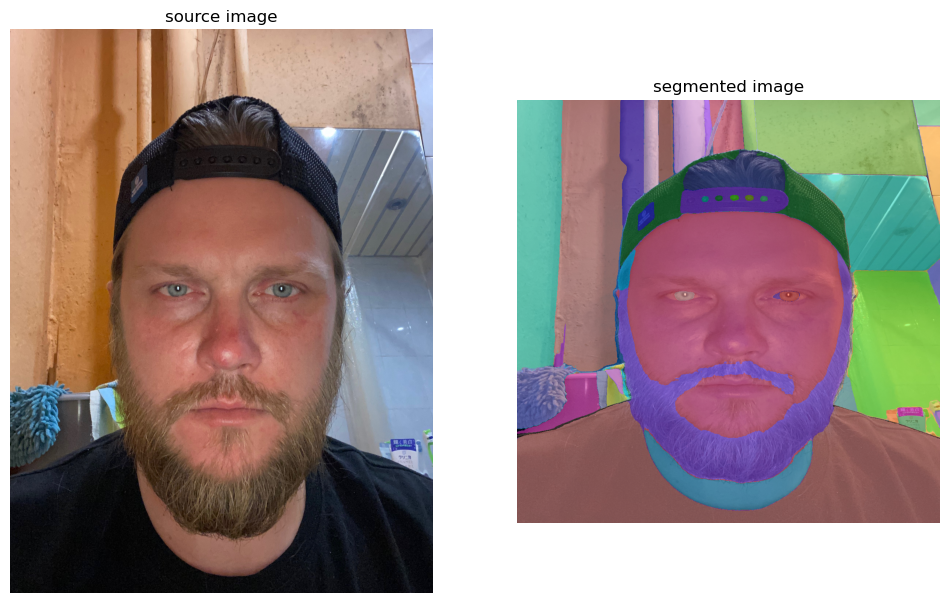

In [12]:
import supervision as sv  # Importa a biblioteca supervision para anotação e visualização de imagens

# Cria uma instância de MaskAnnotator com uma tabela de cores baseada em índices
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

# Converte os resultados do modelo SAM para um objeto Detections
detections = sv.Detections.from_sam(sam_result=sam_result)

# Anota a imagem RGB copiada com as detecções obtidas
annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

# Plota a imagem original e a imagem anotada numa grelha
sv.plot_images_grid(
    images=[image_bgr, annotated_image],  # Lista de imagens a serem exibidas
    grid_size=(1, 2),  # Configuração do tamanho da grelha
    titles=['source image', 'segmented image']  # Títulos para cada imagem na grelha
)

Processing Images:   0%|          | 0/13 [00:00<?, ?it/s]

image_rgb.shape (1024, 1024, 3)


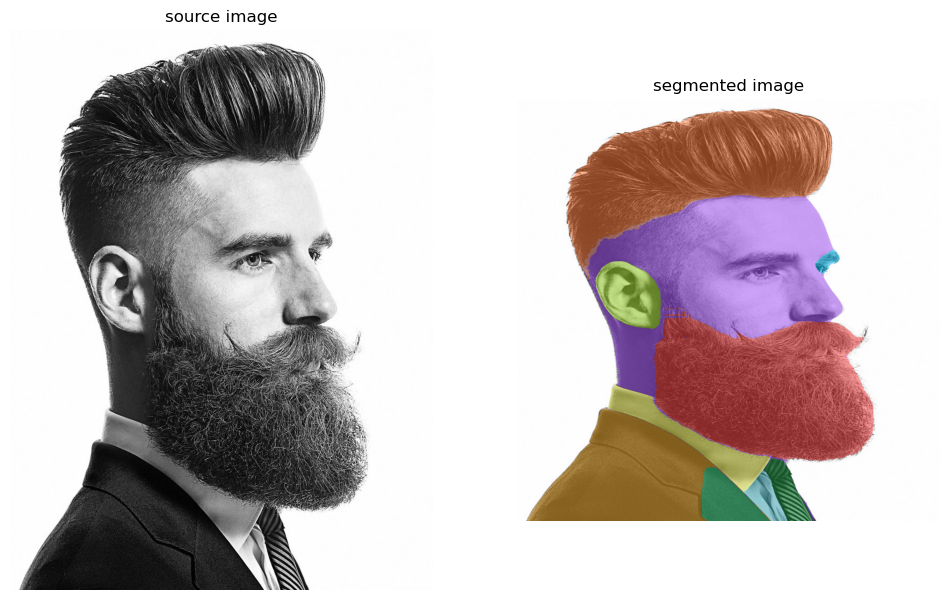

Processing Images:   8%|▊         | 1/13 [01:11<14:21, 71.75s/it]

image_rgb.shape (1024, 1024, 3)


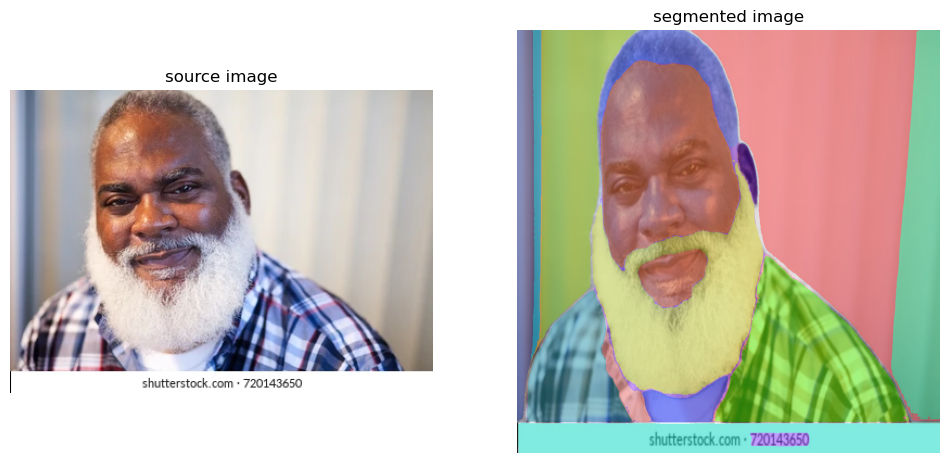

Processing Images:  15%|█▌        | 2/13 [02:32<14:08, 77.17s/it]

image_rgb.shape (1024, 1024, 3)


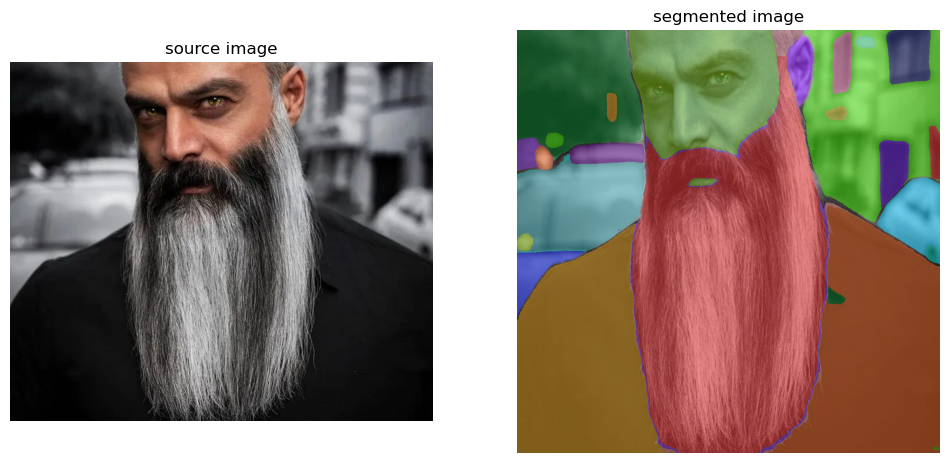

Processing Images:  23%|██▎       | 3/13 [03:40<12:09, 72.91s/it]

image_rgb.shape (1024, 1024, 3)


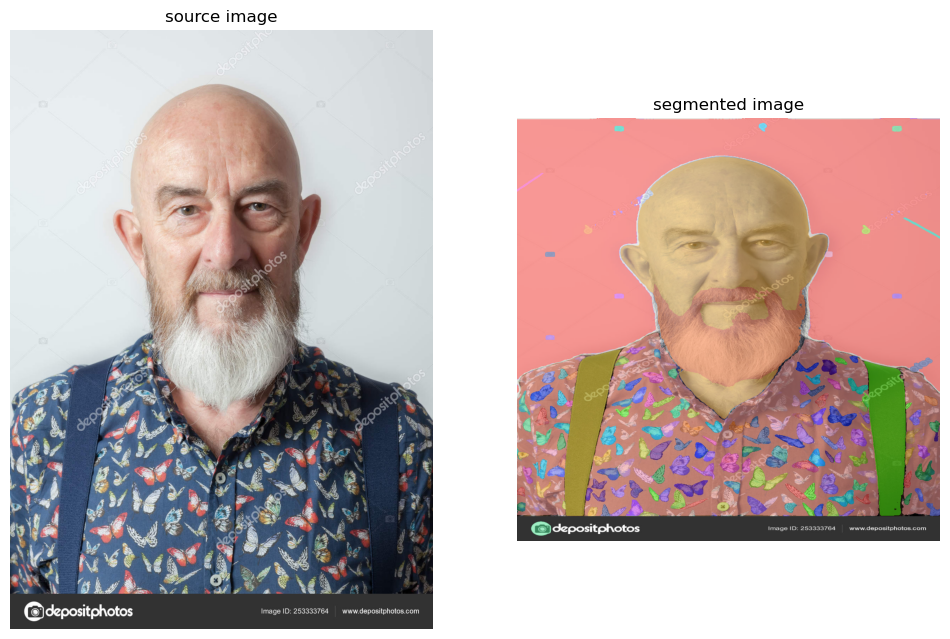

Processing Images:  31%|███       | 4/13 [04:44<10:25, 69.45s/it]

image_rgb.shape (1024, 1024, 3)


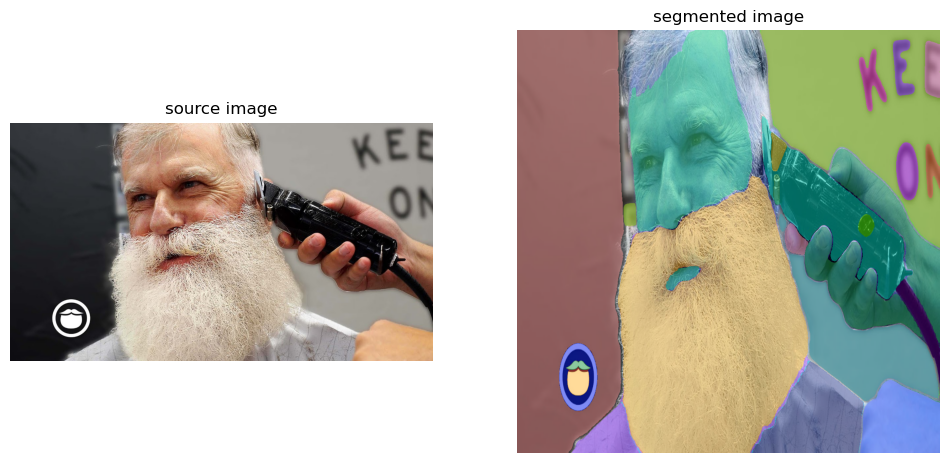

Processing Images:  38%|███▊      | 5/13 [05:50<09:04, 68.07s/it]

image_rgb.shape (1024, 1024, 3)


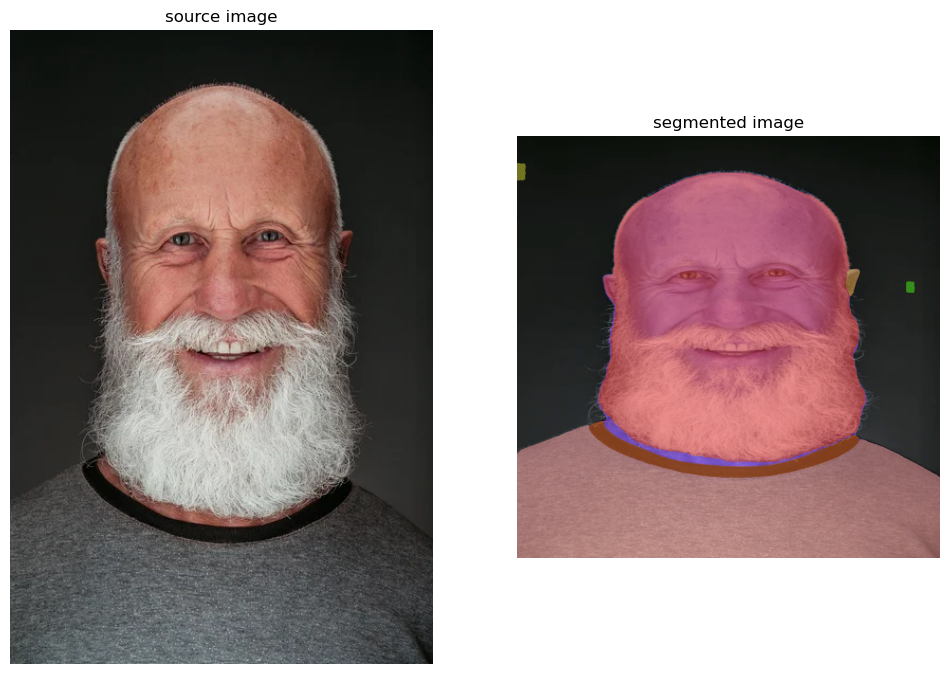

Processing Images:  46%|████▌     | 6/13 [06:58<07:57, 68.26s/it]

image_rgb.shape (1024, 1024, 3)


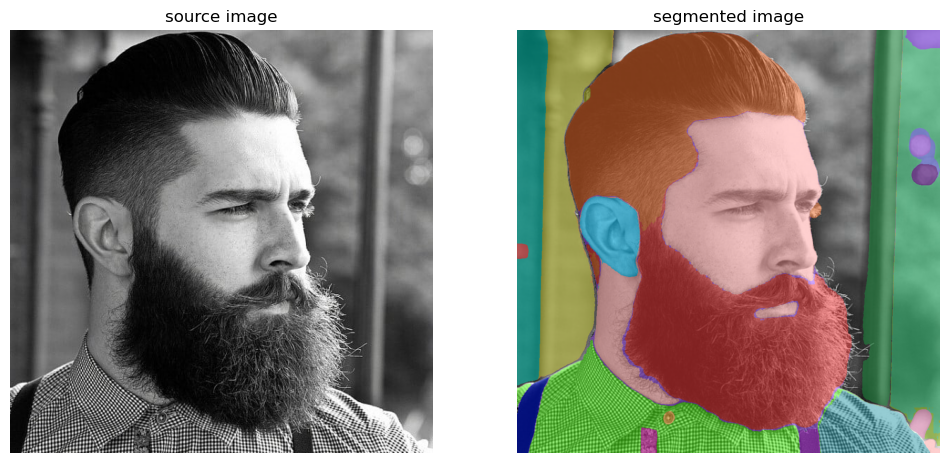

Processing Images:  54%|█████▍    | 7/13 [08:16<07:07, 71.17s/it]

image_rgb.shape (1024, 1024, 3)


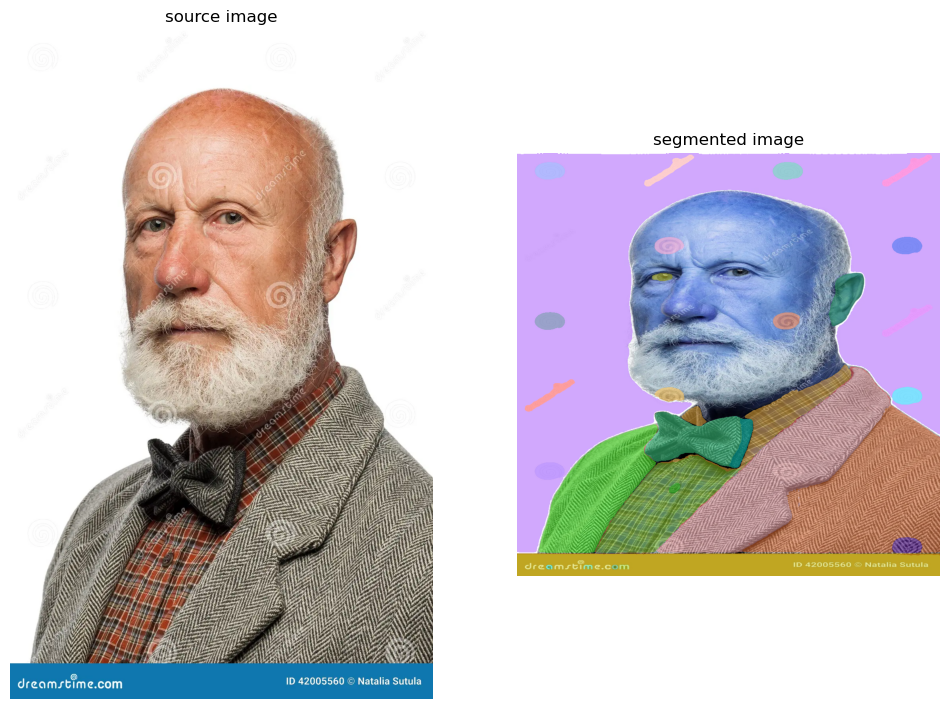

Processing Images:  62%|██████▏   | 8/13 [09:23<05:49, 69.85s/it]

image_rgb.shape (1024, 1024, 3)


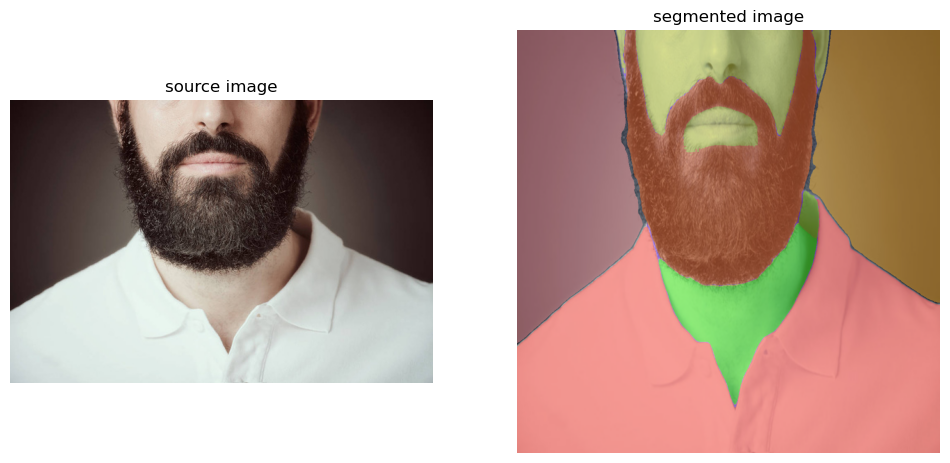

Processing Images:  69%|██████▉   | 9/13 [10:34<04:41, 70.28s/it]

image_rgb.shape (1024, 1024, 3)


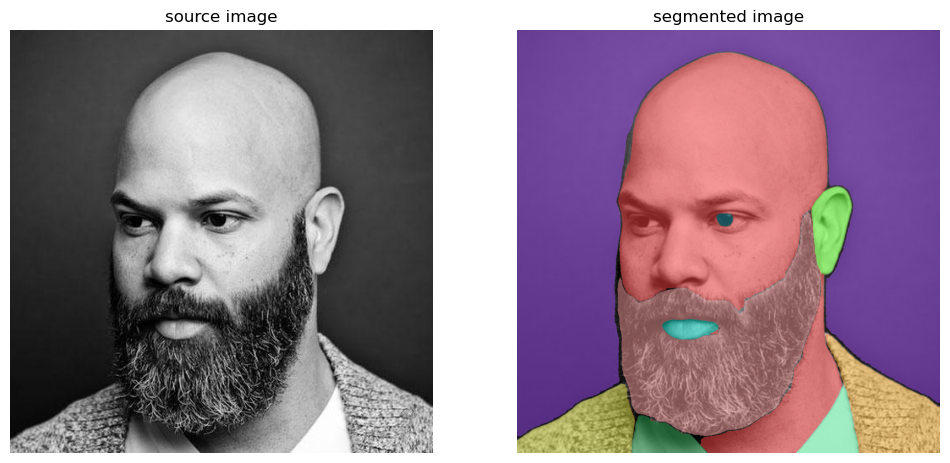

Processing Images:  77%|███████▋  | 10/13 [11:44<03:31, 70.38s/it]

image_rgb.shape (1024, 1024, 3)


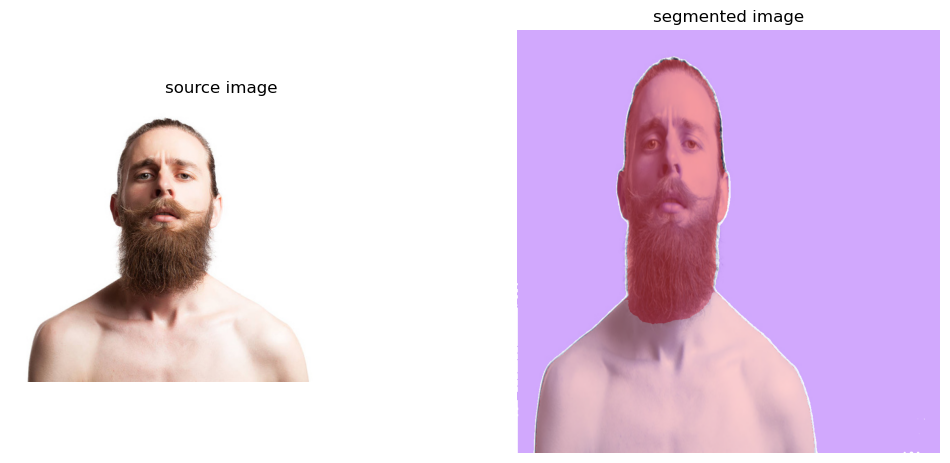

Processing Images:  85%|████████▍ | 11/13 [12:52<02:19, 69.55s/it]

image_rgb.shape (1024, 1024, 3)


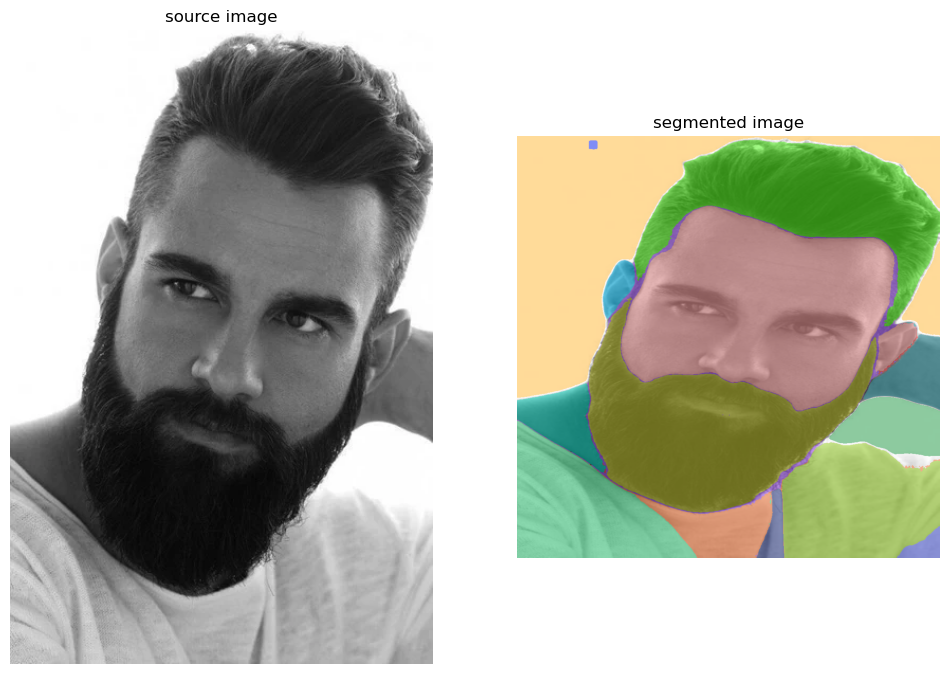

Processing Images:  92%|█████████▏| 12/13 [14:04<01:10, 70.12s/it]

image_rgb.shape (1024, 1024, 3)


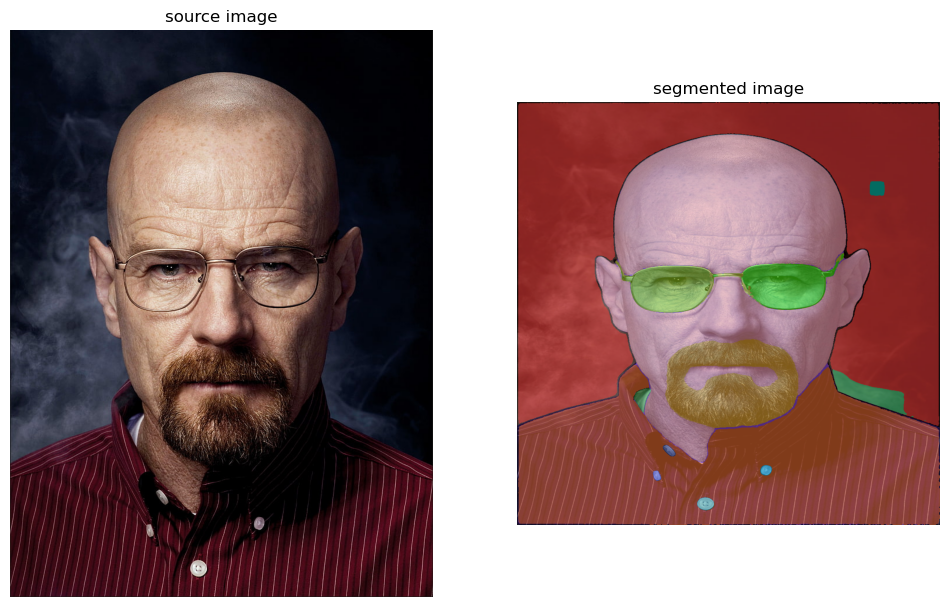

Processing Images: 100%|██████████| 13/13 [15:12<00:00, 70.19s/it]


In [11]:
from tqdm import tqdm  # Importa o módulo tqdm para visualizar barras de progresso
import numpy as np  # Importa a biblioteca numpy para operações matemáticas e manipulação de arrays

# Define o diretório que contém as imagens e o diretório de saída
image_dir = os.path.join(HOME, "teste")
output_dir = os.path.join(HOME, "output")

# Cria o diretório de saída se ele não existir
os.makedirs(output_dir, exist_ok=True)

# Obtém uma lista de todos os ficheiros de imagem no diretório especificado
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.webp'))]

# Itera sobre os ficheiros de imagem
for image_file in tqdm(image_files, desc="Processing Images"):
    image_path = os.path.join(image_dir, image_file)  # Caminho completo da imagem
    image_bgr = cv2.imread(image_path)  # Lê a imagem em formato BGR
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)  # Converte de BGR para RGB
    image_rgb = cv2.resize(image_rgb, (1024, 1024))  # Redimensiona a imagem para 1024x1024 pixels

    # Imprime as dimensões da imagem para verificação
    print("image_rgb.shape", image_rgb.shape)

    # Gera uma máscara para a imagem usando o gerador de máscaras
    sam_result = mask_generator.generate(image_rgb)

    # Anota a imagem com as detecções obtidas
    mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
    detections = sv.Detections.from_sam(sam_result=sam_result)
    annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

    # Plota a imagem original e a imagem anotada
    sv.plot_images_grid(
        images=[image_bgr, annotated_image],
        grid_size=(1, 2),
        titles=['source image', 'segmented image']
    )

    # Cria um diretório para cada imagem para guardar as máscaras
    image_output_dir = os.path.join(output_dir, os.path.splitext(image_file)[0])
    os.makedirs(image_output_dir, exist_ok=True)

    # Guarda as máscaras
    masks = [
        mask['segmentation']  # Extrai as máscaras de segmentação
        for mask in sorted(sam_result, key=lambda x: x['area'], reverse=True)  # Ordena as máscaras por área
    ]

    # Salva cada máscara como uma imagem PNG
    for i, mask in enumerate(masks):
        output_path = os.path.join(image_output_dir, f"mask_{i}.png")
        cv2.imwrite(output_path, (mask * 255).astype(np.uint8))

# Segunda Abordagem

### Foram feitas 3 implementações diferentes com datasets diferentes que essencialmente fazem a mesma coisa. Para cada uma das implementações teremos os ficheiros das imagens, um ficheiro de anotação por imagem e um csv para o dataset completo com a seguinte estrutura:

annotations.txt:
- 395.69188800000006 406 110.00000000000006 406 110.00000000000007 587.271271 395.6918880000001 587.271271 beard 0

CSV:
- Chris-Hemsworth93_538_jpg.rf.477f5de5f0d62216f22c202ac90a5679.jpg 240 240 beard 50 154 192 232

Cada uma destas estruturas representa as *bounding boxes* do item que queremos segmentar (neste caso, a barba). A partir do predictor, definimos quais as regiões que queremos que o modelo segmente, com a condição de que queremos que ele segmente mais de uma máscara, pois o objetivo mais para a frente será ficar com a máscara que tenha um maior grau de confiança.



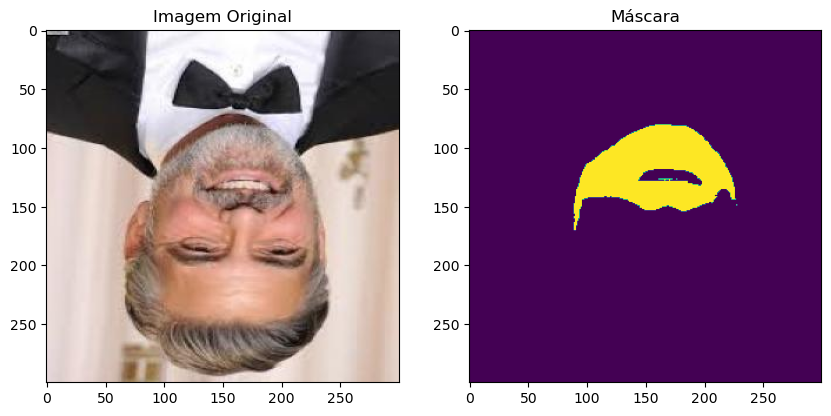

In [12]:
# Importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2

# Definição do nome e do caminho da imagem
IMAGE_NAME = "beard_boxes/train/images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2.jpg"
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

# Verificar se a imagem existe no caminho especificado, se não, lançar um erro
assert os.path.isfile(IMAGE_PATH), f"Imagem não encontrada: {IMAGE_PATH}"

# Ler o ficheiro CSV que contém as anotações das caixas
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes/train/_annotations.csv"))

# Filtrar as anotações para obter apenas as informações da imagem especificada
boxes_csv = boxes_csv[boxes_csv["filename"] == "images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2.jpg"]

# Criar um array numpy com as coordenadas das caixas de delimitação
box = np.array([
    boxes_csv['xmin'],
    boxes_csv['ymin'],
    boxes_csv['xmax'],
    boxes_csv['ymax']
])

# Ler a imagem usando OpenCV
image_bgr = cv2.imread(IMAGE_PATH)
# Converter a imagem de BGR para RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Instanciar o preditor de máscaras
mask_predictor = SamPredictor(sam)
# Definir a imagem no preditor
mask_predictor.set_image(image_rgb)

# Prever a máscara usando a caixa de delimitação
masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=False
)

# Criar uma figura para mostrar as imagens
plt.figure(figsize=(10, 5))  # Ajustar o tamanho conforme necessário

# Mostrar a imagem original
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Imagem Original')

# Mostrar a máscara
plt.subplot(1, 2, 2)
plt.imshow(masks[0])
plt.title('Máscara')

# Exibir as imagens
plt.show()

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


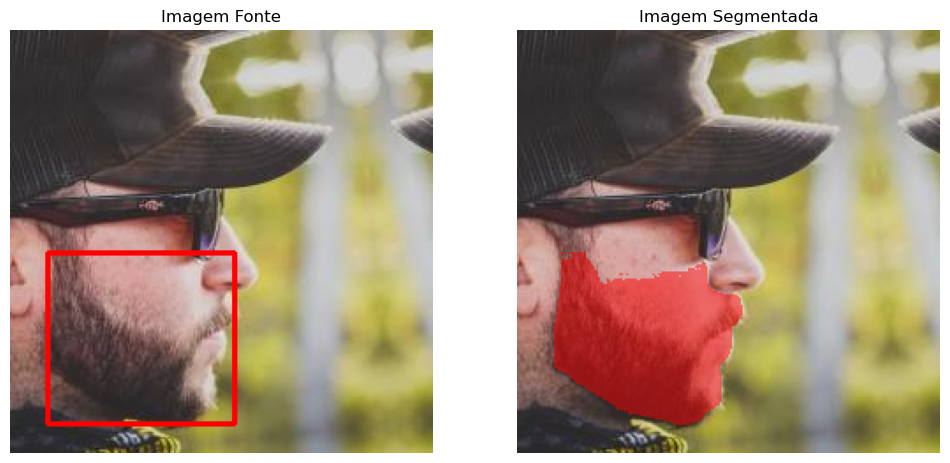

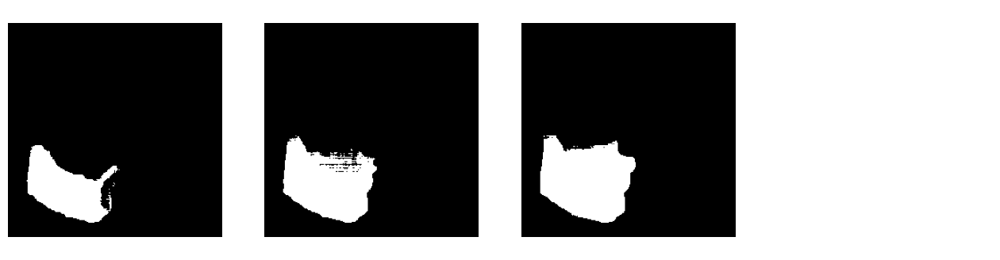

In [13]:
import cv2
from matplotlib import pyplot as plt
import supervision as sv
import numpy as np
import pandas as pd
import os

# Carregar dados de um CSV contendo anotações de imagens
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes_test/train/_annotations.csv"))
# Filtrar para manter apenas as anotações de classe "beard"
boxes_csv = boxes_csv[boxes_csv["class"] == "beard"]

# Ordenar os dados pelo nome do ficheiro
boxes_csv = boxes_csv.sort_values(by=['filename'])

# Selecionar o nome da imagem
IMAGE_NAME = 'beard_boxes_test/train/'+boxes_csv["filename"].values[4]
# Construir o caminho completo para a imagem
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

# Verificar se a imagem existe; caso contrário, emitir um erro
assert os.path.isfile(IMAGE_PATH), f"Image not found: {IMAGE_PATH}"

# Extrair as coordenadas da caixa delimitadora para a quinta imagem
box = np.array([
    boxes_csv['xmin'].values[4],
    boxes_csv['ymin'].values[4],
    boxes_csv['xmax'].values[4],
    boxes_csv['ymax'].values[4]
])

# Ler a imagem e converter de BGR (OpenCV) para RGB (matplotlib)
image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Inicializar o preditor de máscaras com o modelo 'sam'
mask_predictor = SamPredictor(sam)
mask_predictor.set_image(image_rgb)

# Prever máscaras usando a caixa delimitadora
masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=True
)

# Anotar a imagem com caixas delimitadoras e máscaras
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

# Criar detecções a partir das máscaras
detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
# Filtrar para manter apenas a detecção com a maior área
detections = detections[detections.area == np.max(detections.area)]

# Anotar a imagem original com as caixas delimitadoras
source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
# Anotar a imagem original com as máscaras
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# Exibir as imagens anotadas em grade
sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['Imagem Fonte', 'Imagem Segmentada']
)

# Exibir as máscaras em grade
sv.plot_images_grid(
    images=masks,
    grid_size=(1, 4),
    size=(16, 4)
)

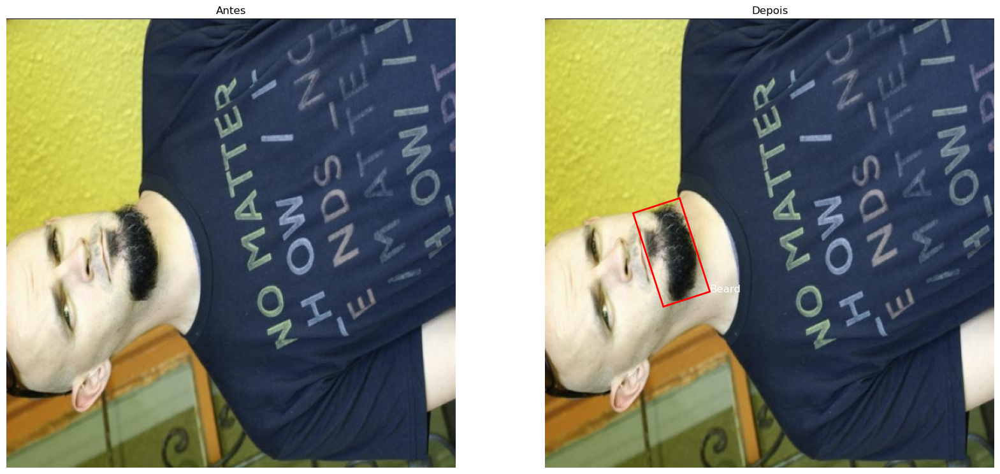

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


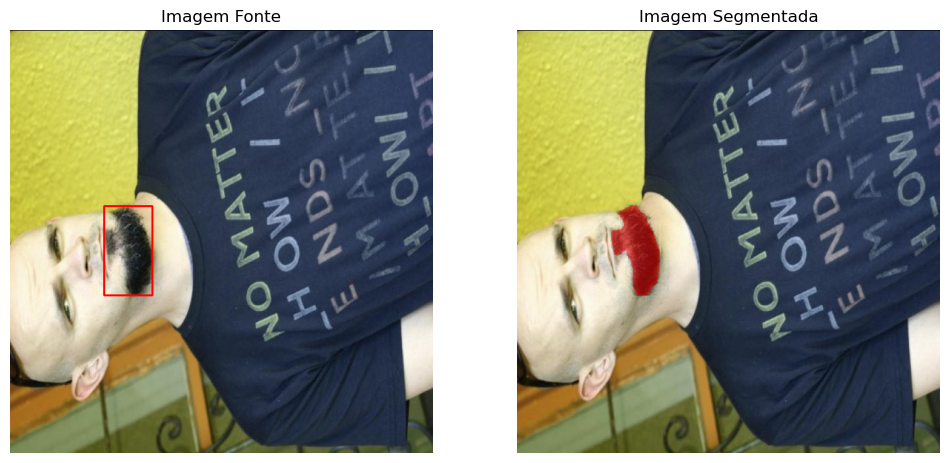

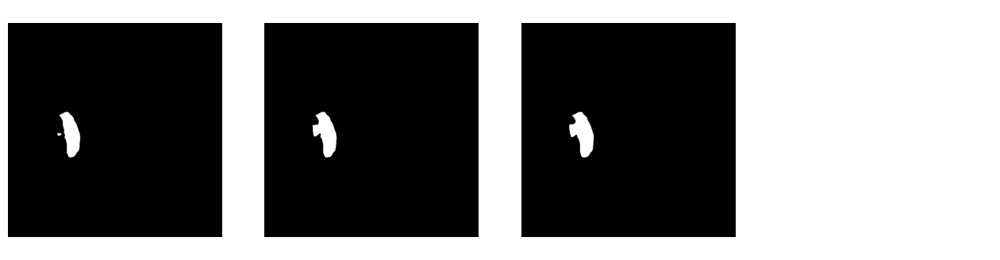

In [13]:
import os
import json
import random
import numpy as np
import supervision as sv

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2

# Definição dos caminhos
beard_segmented_dir = os.path.join(HOME, 'beard_segmented')
train_dir = os.path.join(beard_segmented_dir, 'train')
images_dir = os.path.join(train_dir, 'images')
labels_dir = os.path.join(train_dir, 'label')

# Listagem e filtragem dos arquivos de imagem
image_files = [file for file in os.listdir(images_dir) if file.endswith('.jpg')]

# Seleção aleatória de um arquivo de imagem
random_image_file = random.choice(image_files)
random_annotation_file = random_image_file.replace('.jpg', '.txt')

# Caminhos completos para a imagem e anotação
image_path = os.path.join(images_dir, random_image_file)
annotation_path = os.path.join(labels_dir, random_annotation_file)

# Carregamento da imagem
image = Image.open(image_path).convert('RGB')

# Carregamento e processamento da anotação
with open(annotation_path, 'r') as file:
    annotations = file.read().strip().split()[:-2]
float_annotations = [float(item) for item in annotations]
vertices_array = np.array(float_annotations).reshape(-1, 2)

# Plotagem da imagem antes e depois da anotação
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(image)
ax[0].set_title('Antes')
ax[0].axis('off')

ax[1].imshow(image)
polygon = patches.Polygon(vertices_array, closed=True, edgecolor='r', fill=None, linewidth=2)
ax[1].add_patch(polygon)
ax[1].text(vertices_array[0][0], vertices_array[0][1], 'Beard', color='white', fontsize=12)
ax[1].set_title('Depois')
ax[1].axis('off')
plt.show()

# Calculo da caixa delimitadora a partir dos vértices
xmin, ymin = np.min(vertices_array, axis=0)
xmax, ymax = np.max(vertices_array, axis=0)
box = np.array([xmin, ymin, xmax, ymax])

# Carregamento da imagem em BGR para processamento de visão computacional
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Inicialização do preditor de máscaras e predição
mask_predictor = SamPredictor(sam)
mask_predictor.set_image(image_rgb)
masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

# Anotação da imagem com caixas delimitadoras e máscaras
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)
detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# Exibição das imagens anotadas em grade
sv.plot_images_grid(images=[source_image, segmented_image], grid_size=(1, 2), titles=['Imagem Fonte', 'Imagem Segmentada'])

# Exibição das máscaras em grade
sv.plot_images_grid(images=masks, grid_size=(1, 4), size=(16, 4))

# Construção dos datasets com máscaras


#### Nesta parte foi feito o loop que foi utilizado para cada dataset.Usamos os datasets (beard_boxes) e (beard_segmented) para a criação do nosso dataset. Não foi usado o dataset (beard_boxes_test) devido a conter bastante ruidos nas imagens, por se tratar dum dataset com bounding boxes para diferentes items das faces logo não era focado para a tarefa em análise e acabamos por ter resultados bastante maus na segmentação também. 
#### De qualquer das formas a lógica é bastante semelhante ao visto anteriormente apenas adaptado para fazer o processo em loop para todas as imagens de cada dataset

# Beard_Boxes

In [ ]:
# Importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
from tqdm import tqdm

# Definir o diretório base e os caminhos
images_dir = os.path.join(HOME, "beard_boxes/train")
annotations_csv_path = os.path.join(HOME, "beard_boxes/train/_annotations.csv")

# Verificar se o diretório de imagens e o CSV de anotações existem
assert os.path.isdir(images_dir), f"Diretório de imagens não encontrado: {images_dir}"
assert os.path.isfile(annotations_csv_path), f"Ficheiro CSV de anotações não encontrado: {annotations_csv_path}"

# Ler o ficheiro CSV que contém as anotações das caixas
boxes_csv = pd.read_csv(annotations_csv_path)

# Instanciar o preditor de máscaras
mask_predictor = SamPredictor(sam)

# Criar diretório de saída para as máscaras
output_masks_dir = os.path.join(HOME, "output_masks_2nd")
os.makedirs(output_masks_dir, exist_ok=True)

# Iterar sobre cada imagem no CSV de anotações com tqdm para a barra de progresso
for filename in tqdm(boxes_csv['filename'].unique(), desc="Processando imagens"):
    # Filtrar as anotações para obter apenas as informações da imagem atual
    image_annotations = boxes_csv[boxes_csv['filename'] == filename]
    
    IMAGE_PATH = os.path.join(images_dir, filename)

    # Verificar se a imagem existe no caminho especificado, se não, continuar para a próxima
    if not os.path.isfile(IMAGE_PATH):
        print(f"Imagem não encontrada: {IMAGE_PATH}")
        continue

    # Ler a imagem usando OpenCV
    image_bgr = cv2.imread(IMAGE_PATH)

    # Verificar se a imagem é preta e branca
    if len(image_bgr.shape) < 3 or image_bgr.shape[2] == 1:
        print(f"Imagem preta e branca, ignorando: {IMAGE_PATH}")
        continue

    # Converter a imagem de BGR para RGB
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Definir a imagem no preditor
    mask_predictor.set_image(image_rgb)

    # Processar cada anotação (caixa de delimitação) para a imagem atual
    for idx, row in image_annotations.iterrows():
        # Criar um array numpy com as coordenadas das caixas de delimitação
        box = np.array([
            row['xmin'],
            row['ymin'],
            row['xmax'],
            row['ymax']
        ])
        
        highest_score = -1
        best_mask = None

        # Prever a máscara usando a caixa de delimitação
        masks, scores, logits = mask_predictor.predict(
            box=box,
            multimask_output=True
        )

        # Encontrar a máscara com o maior score
        for mask, score in zip(masks, scores):
            if score > highest_score:
                highest_score = score
                best_mask = mask

        # Criar diretório de saída específico para esta imagem
        image_output_dir = os.path.join(output_masks_dir, os.path.splitext(filename)[0])
        os.makedirs(image_output_dir, exist_ok=True)

        # Salvar todas as máscaras e imprimir os scores
        for i, (mask, score) in enumerate(zip(masks, scores)):
            mask_filename = f"mascara_{idx}_{i}____{score:.4f}.png"
            mask_path = os.path.join(image_output_dir, mask_filename)
            mask = (mask.astype(np.uint8) * 255)
            cv2.imwrite(mask_path, mask)
            print(f"Salvou: {mask_path} com score: {score}")

    # Salvar a imagem original no diretório de saída
    cv2.imwrite(os.path.join(image_output_dir, filename), image_bgr)

# Beard_Boxes_Test

In [11]:
import cv2
from matplotlib import pyplot as plt
import supervision as sv
import numpy as np
import pandas as pd
import os
from tqdm import tqdm  # Importar tqdm para funcionalidade de barra de progresso

# Carregar dados de um CSV contendo anotações de imagens
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes_test/train/_annotations.csv"))
# Filtrar para manter apenas anotações da classe "barba"
boxes_csv = boxes_csv[boxes_csv["class"] == "beard"]

# Baralhar os dados
boxes_csv = boxes_csv.sample(frac=1).reset_index(drop=True)

# Manter apenas 10 linhas
boxes_csv = boxes_csv.head(10)

# Ordenar os dados pelo nome do ficheiro
boxes_csv = boxes_csv.sort_values(by=['filename'])

# Criar diretório de saída se não existir
output_dir = os.path.join(HOME, 'output_2nd')
os.makedirs(output_dir, exist_ok=True)

mask_predictor = SamPredictor(sam)

# Usar tqdm para acompanhar o progresso do loop que processa as imagens
for index, row in tqdm(boxes_csv.iterrows(), total=boxes_csv.shape[0], desc="Processando Imagens"):
    # Construir o caminho completo para a imagem
    image_path = os.path.join(HOME, 'beard_boxes_test/train', row['filename'])

    # Verificar se a imagem existe; se não, saltar para a próxima
    if not os.path.isfile(image_path):
        print(f"Imagem não encontrada: {image_path}")
        continue

    # Extrair as coordenadas da caixa de delimitação
    box = np.array([row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Ler a imagem e converter de BGR (OpenCV) para RGB (matplotlib)
    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Inicializar o preditor de máscara com o modelo 'sam'
    mask_predictor.set_image(image_rgb)

    # Prever máscaras usando a caixa de delimitação
    masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

    # Anotar a imagem com caixas de delimitação e máscaras
    box_annotator = sv.BoxAnnotator(color=sv.Color.red())
    mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

    # Criar deteções a partir das máscaras
    detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
    # Manter apenas a deteção com a maior área
    detections = detections[detections.area == np.max(detections.area)]

    # Anotar a imagem original com as caixas de delimitação
    source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
    # Anotar a imagem original com as máscaras
    segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

    # Guardar as imagens anotadas
    cv2.imwrite(os.path.join(output_dir, f'{index}_source.jpg'), cv2.cvtColor(source_image, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(output_dir, f'{index}_segmented.jpg'), cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))

print("Processamento concluído. Resultados guardados em", output_dir)

Processing Images:   0%|          | 0/10 [00:00<?, ?it/s]SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
Processing Images:  10%|█         | 1/10 [00:15<02:21, 15.69s/it]SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `

Processing complete. Results are saved in /Users/nuno/programação/aprendizagem_visao/output_2nd


# Beard_Segmented

In [8]:
import os
import numpy as np
import cv2
from PIL import Image
from tqdm import tqdm

# Definir os caminhos
beard_segmented_dir = os.path.join(HOME, 'beard_segmented')
train_dir = os.path.join(beard_segmented_dir, 'train')
images_dir = os.path.join(train_dir, 'images')
labels_dir = os.path.join(train_dir, 'label')

# Criar o diretório de saída se não existir
output_dir = "output_masks"
os.makedirs(output_dir, exist_ok=True)

# Listar ficheiros de imagem
image_files = [file for file in os.listdir(images_dir) if file.endswith('.jpg')]
mask_predictor = SamPredictor(sam)  

# Filtrar imagens com base nas anotações
filtered_image_files = []
annotations_to_check = []
for image_file in image_files:
    annotation_file = image_file.replace('.jpg', '.txt')
    annotation_path = os.path.join(labels_dir, annotation_file)
    
    with open(annotation_path, 'r') as file:
        annotations = file.read().strip().split()[:-2]
    
    if 'beard' not in annotations:
        filtered_image_files.append(image_file)
        annotations_to_check.append(annotations)

count = 0
# Processar imagens após a filtragem
for image_file, annotations in tqdm(zip(filtered_image_files, annotations_to_check), total=len(filtered_image_files), desc="A processar imagens"):
    try:
        count += 1
        if count > 5:
            break
        image_path = os.path.join(images_dir, image_file)
        float_annotations = [float(item) for item in annotations]
        vertices_array = np.array(float_annotations).reshape(-1, 2)

        xmin, ymin = np.min(vertices_array, axis=0)
        xmax, ymax = np.max(vertices_array, axis=0)
        box = np.array([xmin, ymin, xmax, ymax])

        image_bgr = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        mask_predictor.set_image(image_rgb)
        masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

        image_output_dir = os.path.join(output_dir, image_file[:-4])
        os.makedirs(image_output_dir, exist_ok=True)

        for i, mask in enumerate(masks):
            mask_filename = f"máscara_{i}____{scores[i]}.jpg"
            mask = (mask.astype(np.uint8) * 255)
            mask_path = os.path.join(image_output_dir, mask_filename)
            cv2.imwrite(mask_path, mask)
        
        cv2.imwrite(os.path.join(image_output_dir, image_file), image_bgr)
    except Exception as e:
        print(f"Erro ao processar imagem: {image_file} - {e}")

A processar imagens:   1%|▏         | 5/377 [01:15<1:33:03, 15.01s/it]


# DATASET TREINO E VALIDAÇÃO

##### O dataset final é construído organizando imagens e máscaras em diretórios específicos para treino e validação. As imagens processadas são divididas aleatoriamente em 80% para treino e 20% para validação utilizando a função `train_test_split` da biblioteca `sklearn`. Para cada imagem, a melhor máscara é selecionada com base na pontuação, que é extraída do nome do ficheiro da máscara, e copiada para o diretório correspondente. Este processo assegura que tanto as imagens quanto as suas máscaras associadas sejam preparadas de forma estruturada.

##### Após a seleção e cópia das imagens e máscaras, os ficheiros são reorganizados em subdiretórios `images` e `labels` dentro dos diretórios de treino (`train`) e validação (`validation`). As máscaras são renomeadas para corresponder aos nomes das imagens, removendo o sufixo `_mask`.

##### No código, a reorganização dos dados segue uma estrutura hierárquica clara: dentro do diretório base `dataset_final`, são criados os subdiretórios `train` e `validation`. Dentro de cada um desses diretórios, são criados subdiretórios `images` e `labels`. A função `os.makedirs` é utilizada para criar estes diretórios, se ainda não existirem. 

##### O código percorre cada subdiretório dentro dos diretórios de treino e validação, movendo os ficheiros de imagem para o subdiretório `images` e os ficheiros de máscara para o subdiretório `labels`. Isto é feito verificando se o nome do ficheiro contém o sufixo `_mask`. Se contiver, o ficheiro é movido para `labels`; caso contrário, é movido para `images` utilizando a função `shutil.move`.

##### Finalmente, para garantir que cada máscara corresponde diretamente à sua imagem, o código renomeia os ficheiros de máscara no subdiretório `labels`, removendo o sufixo `_mask` dos nomes dos ficheiros. Este passo é realizado utilizando a função `os.rename`, o que assegura uma correspondência clara e direta entre cada imagem e a sua respetiva máscara, simplificando a pipeline de treino e validação.

Copy
# DATASET TESTE

##### O dataset de teste é construído processando imagens anotadas com caixas delimitadoras de barba.O preditor de máscaras gera as máscaras para cada caixa. As imagens e máscaras são guardadas em diretórios específicos. As imagens são convertidas para RGB e processadas sequencialmente.

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
from tqdm import tqdm

# Definir o diretório base e os caminhos
images_dir_beard_boxes = os.path.join(HOME, "beard_boxes/valid")
annotations_csv_path = os.path.join(HOME, "beard_boxes/valid/_annotations.csv")

# Verificar se o diretório de imagens e o CSV de anotações existem
assert os.path.isdir(images_dir_beard_boxes), f"Diretório de imagens não encontrado: {images_dir_beard_boxes}"
assert os.path.isfile(annotations_csv_path), f"Ficheiro CSV de anotações não encontrado: {annotations_csv_path}"

# Ler o ficheiro CSV que contém as anotações das caixas
boxes_csv = pd.read_csv(annotations_csv_path)

# Instanciar o preditor de máscaras
mask_predictor = SamPredictor(sam)

# Criar diretório de saída para as máscaras
output_masks_dir = os.path.join(HOME, "dataset_final/test")
os.makedirs(output_masks_dir, exist_ok=True)

images_dir = os.path.join(output_masks_dir, 'images')
os.makedirs(images_dir, exist_ok=True)
labels_dir = os.path.join(output_masks_dir, 'label')
os.makedirs(labels_dir, exist_ok=True)

# Inicializar contadores para imagens e máscaras
image_counter = 1

# Iterar sobre cada imagem no CSV de anotações com tqdm para a barra de progresso
for filename in tqdm(boxes_csv['filename'].unique(), desc="Processando imagens"):
    # Filtrar as anotações para obter apenas as informações da imagem atual
    image_annotations = boxes_csv[boxes_csv['filename'] == filename]
    
    IMAGE_PATH = os.path.join(images_dir_beard_boxes, filename)

    # Verificar se a imagem existe no caminho especificado, se não, continuar para a próxima
    if not os.path.isfile(IMAGE_PATH):
        print(f"Imagem não encontrada: {IMAGE_PATH}")
        continue

    # Ler a imagem usando OpenCV
    image_bgr = cv2.imread(IMAGE_PATH)

    # Salvar a imagem original no diretório de saída com nome sequencial
    image_filename = f"{image_counter}.jpg"
    cv2.imwrite(os.path.join(images_dir, image_filename), image_bgr)

    # Converter a imagem de BGR para RGB
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Definir a imagem no preditor
    mask_predictor.set_image(image_rgb)

    # Processar cada anotação (caixa de delimitação) para a imagem atual
    for idx, row in image_annotations.iterrows():
        # Criar um array numpy com as coordenadas das caixas de delimitação
        box = np.array([
            row['xmin'],
            row['ymin'],
            row['xmax'],
            row['ymax']
        ])
        
        highest_score = -1
        best_mask = None

        # Prever a máscara usando a caixa de delimitação
        masks, scores, logits = mask_predictor.predict(
            box=box,
            multimask_output=True
        )

        # Encontrar a máscara com o maior score
        for mask, score in zip(masks, scores):
            if score > highest_score:
                highest_score = score
                best_mask = mask

        # Salvar a máscara com o maior score
        if best_mask is not None:
            mask_filename = f"{image_counter}.jpg"
            mask_path = os.path.join(labels_dir, mask_filename)
            best_mask = (best_mask.astype(np.uint8) * 255)
            cv2.imwrite(mask_path, best_mask)
            
    image_counter += 1
# # Segunda parte do código
# beard_segmented_dir = os.path.join(HOME, 'beard_segmented')
# valid_dir = os.path.join(beard_segmented_dir, 'valid')
# images_dir = os.path.join(valid_dir, 'images')
# labels_dir = os.path.join(valid_dir, 'label')

# # Listar ficheiros de imagem
# image_files = [file for file in os.listdir(images_dir) if file.endswith('.jpg')]
# mask_predictor = SamPredictor(sam)

# # Filtrar imagens com base nas anotações
# filtered_image_files = [file for file in image_files if file in boxes_csv['filename'].unique()]

# # Iterar sobre cada imagem filtrada
# for image in tqdm(filtered_image_files, desc="Processando imagens segmentadas"):
#     IMAGE_PATH = os.path.join(images_dir, image)

#     # Verificar se a imagem existe no caminho especificado, se não, continuar para a próxima
#     if not os.path.isfile(IMAGE_PATH):
#         print(f"Imagem não encontrada: {IMAGE_PATH}")
#         continue

#     # Ler a imagem usando OpenCV
#     image_bgr = cv2.imread(IMAGE_PATH)

#     # Converter a imagem de BGR para RGB
#     image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

#     # Definir a imagem no preditor
#     mask_predictor.set_image(image_rgb)

#     # Filtrar as anotações para obter apenas as informações da imagem atual
#     image_annotations = boxes_csv[boxes_csv['filename'] == image]

#     # Processar cada anotação (caixa de delimitação) para a imagem atual
#     for idx, row in image_annotations.iterrows():
#         # Criar um array numpy com as coordenadas das caixas de delimitação
#         box = np.array([
#             row['xmin'],
#             row['ymin'],
#             row['xmax'],
#             row['ymax']
#         ])

#         highest_score = -1
#         best_mask = None

#         # Prever a máscara usando a caixa de delimitação
#         masks, scores, logits = mask_predictor.predict(
#             box=box,
#             multimask_output=True
#         )

# # Encontrar a máscara com o maior score
#         for mask, score in zip(masks, scores):
#             if score > highest_score:
#                 highest_score = score
#                 best_mask = mask

#         # Salvar a máscara com o maior score
#         if best_mask is not None:
#             mask_filename = f"{os.path.splitext(filename)[0]}_mask.png"
#             mask_path = os.path.join(labels_dir, mask_filename)
#             best_mask = (best_mask.astype(np.uint8) * 255)
#             cv2.imwrite(mask_path, best_mask)

#     # Salvar a imagem original no diretório de saída com nome sequencial
#     image_filename = f"{image_counter}.jpg"
#     cv2.imwrite(os.path.join(output_masks_dir, image_filename), image_bgr)
#     image_counter += 1

NameError: name 'SamPredictor' is not defined

In [29]:

import os
import shutil
import cv2
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split 
import os
import shutil

# Definir o diretório base e os subdiretórios
output_masks_dir = os.path.join(HOME, "output_masks")
output_masks_2nd_dir = os.path.join(HOME, "output_masks_2nd")


# Diretório final para os resultados combinados
final_output_dir = os.path.join(HOME, "dataset_final")
train_dir = os.path.join(final_output_dir, 'train')
val_dir = os.path.join(final_output_dir, 'validation')
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)



# Obter todos os nomes das pastas das imagens processadas
processed_dirs = set(dirpath for dirpath, dirnames, filenames in os.walk(output_masks_dir) if not dirnames)

# Adicionar pastas do segundo diretório de máscaras
processed_dirs.update(dirpath for dirpath, dirnames, filenames in os.walk(output_masks_2nd_dir) if not dirnames)

filenames = set()
#check if each one exists and also if it has duplicate filename
for dirpath in processed_dirs:
    if not os.path.isdir(dirpath):
        print(f"O diretório não existe: {dirpath}")
        continue
    
    for filename in os.listdir(dirpath):
        filename = os.path.splitext(filename)[0]
        # print(filename)
        if filename in filenames:
            print(f"Nome de ficheiro duplicado: {filename}")
        filenames.add(filename)
    
    


# Dividir em treino e validação
train_dirs, val_dirs = train_test_split(list(processed_dirs), test_size=0.2, random_state=42)

# Processar e salvar imagens e máscaras para treino
train_idx = 1
for image_dir in tqdm(train_dirs, desc="Processando imagens de treino"):
    image_output_dir = os.path.join(train_dir, str(train_idx))
    os.makedirs(image_output_dir, exist_ok=True)
    
    # Caminho para a imagem original
    image_path = os.path.join(image_dir, os.path.basename(image_dir) + '.jpg')
    if not os.path.isfile(image_path):
        print(f"Imagem não encontrada: {image_path}")
        train_idx += 1
        continue
    
    # Ler a imagem original
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print(f"Erro ao ler a imagem: {image_path}")
        train_idx += 1
        continue
    
    # Caminho para a imagem de saída usando o índice
    output_image_path = os.path.join(image_output_dir, f"{train_idx}.jpg")
    shutil.copy(image_path, output_image_path)
    
    # Initialize variables
    highest_score = -float('inf')
    best_mask_path = None

    # Loop for the first directory
    mask_dir = output_masks_dir
    mask_path = os.path.join(mask_dir, os.path.basename(image_dir))
    if os.path.isdir(mask_path):
        for mask_filename in os.listdir(mask_path):
            # print(mask_filename)
            if 'mascara' in mask_filename or 'máscara' in mask_filename:
                score_str = mask_filename.split('____')[-1].replace('.png', '').replace('.jpg', '')
                try:
                    score = float(score_str)
                    if score > highest_score:
                        highest_score = score
                        best_mask_path = os.path.join(mask_path, mask_filename)
                except Exception as e:
                    print(e)
                    continue

    # Loop for the second directory
    mask_dir = output_masks_2nd_dir
    mask_path = os.path.join(mask_dir, os.path.basename(image_dir))
    if os.path.isdir(mask_path):
        for mask_filename in os.listdir(mask_path):
            # print(mask_filename)
            if 'mascara' in mask_filename or 'máscara' in mask_filename:
                score_str = mask_filename.split('____')[-1].replace('.png', '').replace('.jpg', '')
                try:
                    score = float(score_str)
                    if score > highest_score:
                        highest_score = score
                        best_mask_path = os.path.join(mask_path, mask_filename)
                except Exception as e:
                    print(e)
                    continue
        
    if best_mask_path:
        # Caminho para a máscara de saída usando o índice
        output_mask_path = os.path.join(image_output_dir, f"{train_idx}_mask.png")
        shutil.copy(best_mask_path, output_mask_path)
        # print(f"Salvou a melhor máscara com score {highest_score} para o índice {train_idx}")
    
    train_idx += 1

# Processar e salvar imagens e máscaras para validação
val_idx = 1
for image_dir in tqdm(val_dirs, desc="Processando imagens de validação"):
    image_output_dir = os.path.join(val_dir, str(val_idx))
    os.makedirs(image_output_dir, exist_ok=True)
    
    # Caminho para a imagem original
    image_path = os.path.join(image_dir, os.path.basename(image_dir) + '.jpg')
    if not os.path.isfile(image_path):
        print(f"Imagem não encontrada: {image_path}")
        val_idx += 1
        continue
    
    # Ler a imagem original
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print(f"Erro ao ler a imagem: {image_path}")
        val_idx += 1
        continue
    
    # Caminho para a imagem de saída usando o índice
    output_image_path = os.path.join(image_output_dir, f"{val_idx}.jpg")
    shutil.copy(image_path, output_image_path)
    
    # Initialize variables
    highest_score = -float('inf')
    best_mask_path = None

    # Loop for the first directory
    mask_dir = output_masks_dir
    mask_path = os.path.join(mask_dir, os.path.basename(image_dir))
    if os.path.isdir(mask_path):
        for mask_filename in os.listdir(mask_path):
            if 'mascara' in mask_filename or 'máscara' in mask_filename:
                score_str = mask_filename.split('____')[-1].replace('.png', '').replace('.jpg', '')
                try:
                    score = float(score_str)
                    if score > highest_score:
                        highest_score = score
                        best_mask_path = os.path.join(mask_path, mask_filename)
                except Exception as e:
                    print(e)
                    continue
            else:
                ...
                # print(mask_filename)


    # Loop for the second directory
    mask_dir = output_masks_2nd_dir
    mask_path = os.path.join(mask_dir, os.path.basename(image_dir))
    if os.path.isdir(mask_path):
        for mask_filename in os.listdir(mask_path):
            if 'mascara' in mask_filename or 'máscara' in mask_filename:
                score_str = mask_filename.split('____')[-1].replace('.png', '').replace('.jpg', '')
                try:
                    score = float(score_str)
                    if score > highest_score:
                        highest_score = score
                        best_mask_path = os.path.join(mask_path, mask_filename)
                except Exception as e:
                    print(e)
                    continue
            else:
                ...
                # print(mask_filename)
    
    if best_mask_path:
        # Caminho para a máscara de saída usando o índice
        output_mask_path = os.path.join(image_output_dir, f"{val_idx}_mask.png")
        shutil.copy(best_mask_path, output_mask_path)
    # else:
    #     print("Não gravei wi")
    #     print(highest_score)
        # print(f"Salvou a melhor máscara com score {highest_score} para o índice {val_idx}")
    
    val_idx += 1

# # Define the base path of your dataset



Processando imagens de validação: 100%|██████████| 152/152 [00:00<00:00, 605.37it/s]


In [30]:
import os
import shutil

# Define the base path of your dataset

PATH_VALIDATION = 'validation'
PATH_TRAIN = 'train'

for PATH in [PATH_VALIDATION, PATH_TRAIN]:
    base_path = f'dataset_final/{PATH}'

    # Define the new paths
    images_path = os.path.join(base_path, 'images')
    labels_path = os.path.join(base_path, 'labels')

    # Create new directories for images and labels if they don't exist
    os.makedirs(images_path, exist_ok=True)
    os.makedirs(labels_path, exist_ok=True)

    # Loop through each subdirectory in the base path
    for subdir in os.listdir(base_path):
        subdir_path = os.path.join(base_path, subdir)
        if os.path.isdir(subdir_path):
            # Loop through each file in the subdirectory
            for file_name in os.listdir(subdir_path):
                file_path = os.path.join(subdir_path, file_name)
                if '_mask' in file_name:
                    # Move mask files to labels directory
                    shutil.move(file_path, os.path.join(labels_path, file_name))
                else:
                    # Move image files to images directory
                    shutil.move(file_path, os.path.join(images_path, file_name))
    
        # #rename masks to match the images
    for filename in os.listdir(labels_path):
        new_filename = filename.replace('_mask', '')
        os.rename(os.path.join(labels_path, filename), os.path.join(labels_path, new_filename))

    # Optionally, remove empty subdirectories
    for subdir in os.listdir(base_path):
        subdir_path = os.path.join(base_path, subdir)
        if os.path.isdir(subdir_path) and not os.listdir(subdir_path):
            os.rmdir(subdir_path)

print("Files have been reorganized successfully!")


Files have been reorganized successfully!


# MODELO SEGMENTAÇÃO

Nesta secção, utilizei duas abordagens para definir a arquitetura de uma UNet. Na primeira usei o link abaixo, que essencialmente utiliza a mesma metodologia de carregamento de dados que já vimos nas aulas. Esta abordagem também inclui um exemplo do tipo de camada de saída que queremos. Este output será um array onde teremos valores 0 ou 1, representando o objeto que queremos segmentar (1) e o resto (0).

Adicionei um callback que mostra o progresso do modelo à medida que o vamos treinando, fazendo previsões num conjunto de imagens, para que possamos acompanhar o estado do modelo. Também incluí as funções dice_loss e dice_coeff, que, segundo li numa thread do Stack Overflow, mostraram bons resultados, embora ainda não as tenha testado.

Este modelo demora bastante tempo a treinar, mas acredito que em 2/3 horas o processo estará concluído. 

A outra abordagem que usei foi utilizando uma biblioteca chamada keras_segmentation. Nesta biblioteca, temos vários modelos de deep learning implementados com Keras, e a ideia aqui é ter o nosso dataset já organizado e dividido, permitindo que a biblioteca trate da maior parte do "trabalho sujo". Podemos também configurar várias coisas com esta biblioteca, desde aumentações nas imagens até verificação da integridade do dataset.

Eu usei apenas um modelo (resnet50_unet), mas existem muitos outros, e são bastante fáceis de implementar, o que nos permite comparar entre vários modelos.

Essencialmente, temos duas abordagens que acredito que resultarão relativamente bem, mas penso que o nosso grande desafio final será a qualidade das imagens que utilizamos para o dataset. No mundo ideal, teríamos a barba perfeitamente segmentada e obteríamos resultados maravilhosos, mas como estamos a trabalhar um pouco no escuro, é normal que o nosso problema de segmentação não seja completamente resolvido.

Vou tratar de correr os modelos e tirar conclusões, e talvez adicione mais modelos na parte da biblioteca do keras_segmentation.

https://stackoverflow.com/questions/53248099/keras-image-segmentation-using-grayscale-masks-and-imagedatagenerator-class

In [4]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Activation, Dropout, Conv2DTranspose, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, Callback
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt


In [41]:
from image_segmentation_keras.keras_segmentation.models.unet import resnet50_unet
import os

train_image_dir = os.path.join(HOME, 'dataset_final/train/images')
train_image_masks_dir = os.path.join(HOME, 'dataset_final/train/labels')
val_image_dir = os.path.join(HOME, 'dataset_final/validation/images')
val_image_masks_dir = os.path.join(HOME, 'dataset_final/validation/labels')

model = resnet50_unet(n_classes=256, 
                    input_height=224, 
                    input_width=224)

model.train(
    train_images = train_image_dir,
    train_annotations = train_image_masks_dir,
    epochs = 20,
    validate=True,
    # batch_size=32,
    val_images = val_image_dir,
    val_annotations = val_image_masks_dir,
    callbacks = EarlyStopping(monitor='val_loss', patience=3),
)

Verifying training dataset


100%|██████████| 608/608 [00:01<00:00, 550.78it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 656.66it/s]


Dataset verified! 
Epoch 1/20


2024-05-23 02:39:10.939059: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - ETA: 0s - loss: 0.9938 - accuracy: 0.8817

2024-05-23 02:40:44.461245: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - 125s 233ms/step - loss: 0.9938 - accuracy: 0.8817 - val_loss: 0.4542 - val_accuracy: 0.8481
Epoch 2/20
512/512 [==============================] - 112s 218ms/step - loss: 0.1731 - accuracy: 0.9440 - val_loss: 6853.9854 - val_accuracy: 0.5241
Epoch 3/20
512/512 [==============================] - 153s 298ms/step - loss: 0.1454 - accuracy: 0.9528 - val_loss: 13.8880 - val_accuracy: 0.9254
Epoch 4/20
512/512 [==============================] - 155s 302ms/step - loss: 0.1354 - accuracy: 0.9565 - val_loss: 1.4886 - val_accuracy: 0.9249


1/1 [==============================] - 0s 79ms/step


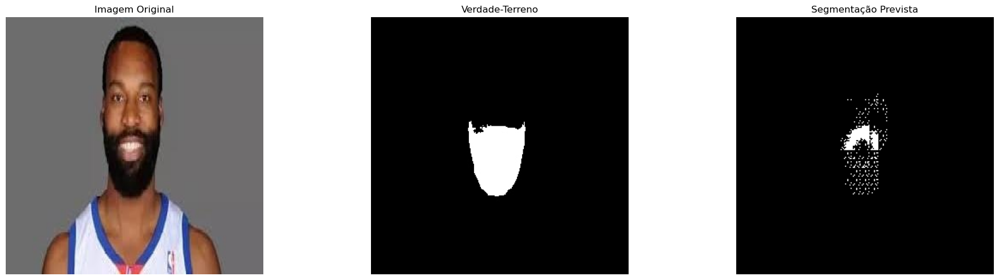

In [47]:
import os
import cv2
import matplotlib.pyplot as plt

# Define os caminhos
IMAGE_PATH = os.path.join(HOME, 'dataset_final/test/images/20.jpg')
IMAGE_PATH_ANO = os.path.join(HOME, 'dataset_final/test/label/20.jpg')

# Carrega a imagem original
original_image = cv2.imread(IMAGE_PATH)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Converte BGR para RGB

# Carrega a anotação de verdade-terreno (ground truth)
ground_truth = cv2.imread(IMAGE_PATH_ANO, cv2.IMREAD_GRAYSCALE)

# Faz a previsão da segmentação
out = model.predict_segmentation(inp=IMAGE_PATH)

# Plota a imagem original, a verdade-terreno, a segmentação prevista e a sobreposição
fig, axes = plt.subplots(1, 3, figsize=(20, 5))  # 4 colunas agora

axes[0].imshow(original_image)
axes[0].set_title('Imagem Original')
axes[0].axis('off')

axes[1].imshow(ground_truth, cmap='gray')
axes[1].set_title('Verdade-Terreno')
axes[1].axis('off')

axes[2].imshow(out, cmap='gray')
axes[2].set_title('Segmentação Prevista')
axes[2].axis('off')


plt.tight_layout()
plt.show()

# Avaliação do modelo
# print(model.evaluate_segmentation(inp_images_dir="dataset1/images_prepped_test/", annotations_dir="dataset1/annotations_prepped_test/"))

In [4]:
from image_segmentation_keras.keras_segmentation.models.fcn import fcn_8, fcn_32, fcn_8_resnet50, fcn_32_resnet50, fcn_8_mobilenet, fcn_32_mobilenet
from image_segmentation_keras.keras_segmentation.models.pspnet import pspnet, pspnet_50, pspnet_101, vgg_pspnet, resnet50_pspnet
from image_segmentation_keras.keras_segmentation.models.unet import unet_mini, unet, vgg_unet, resnet50_unet, mobilenet_unet
from image_segmentation_keras.keras_segmentation.models.segnet import segnet, vgg_segnet, resnet50_segnet, mobilenet_segnet
from keras.callbacks import EarlyStopping
import os

# Define your paths
train_image_dir = os.path.join(HOME, 'dataset_final/train/images')
train_image_masks_dir = os.path.join(HOME, 'dataset_final/train/labels')
val_image_dir = os.path.join(HOME, 'dataset_final/validation/images')
val_image_masks_dir = os.path.join(HOME, 'dataset_final/validation/labels')

# List of model initialization functions and their names
models = [
    ("fcn_8_vgg", fcn_8),
    #("fcn_32_vgg", fcn_32),
    #("fcn_8_resnet50", fcn_8_resnet50),
    #("fcn_32_resnet50", fcn_32_resnet50),
    #("fcn_8_mobilenet", fcn_8_mobilenet),
    #("fcn_32_mobilenet", fcn_32_mobilenet),
    ("pspnet", pspnet),
    #("pspnet_50", pspnet_50),
    #("pspnet_101", pspnet_101),
    #("vgg_pspnet", vgg_pspnet),
    #("resnet50_pspnet", resnet50_pspnet),
    #("unet_mini", unet_mini),
    # ("unet", unet),
    # ("vgg_unet", vgg_unet),
    # ("resnet50_unet", resnet50_unet),
    ("mobilenet_unet", mobilenet_unet),
    # ("segnet", segnet),
    ("vgg_segnet", vgg_segnet),
    #("resnet50_segnet", resnet50_segnet),
    ("mobilenet_segnet", mobilenet_segnet)
]

# Training parameters
n_classes = 256
input_height = 224
input_width = 224
epochs = 20
callbacks = [EarlyStopping(monitor='val_loss', patience=2)]

# Create a directory to save the models
save_dir = os.path.join(HOME, 'saved_models')
os.makedirs(save_dir, exist_ok=True)

# Training loop
for model_name, model_fn in models:
    print(f"\033[91mTraining {model_name}...\033[0m")
    try:
        model = model_fn(n_classes=n_classes, input_height=input_height, input_width=input_width)
        checkpoint_path = os.path.join(HOME, f'checkpoints/{model_name}')
        model.train(
            train_images=train_image_dir,
            train_annotations=train_image_masks_dir,
            epochs=epochs,
            validate=True,
            # batch_size=4,
            val_images=val_image_dir,
            val_annotations=val_image_masks_dir,
            callbacks=callbacks,
            checkpoints_path=checkpoint_path,
            do_augment=True,
            augmentation_name="aug_all",
        )
        
        model.save(os.path.join('checkpoints', f"{model_name}.h5"))
    except:
        model = model_fn(n_classes=n_classes, input_height=192, input_width=192)
        checkpoint_path = os.path.join(HOME, f'checkpoints/{model_name}')
        model.train(
            train_images=train_image_dir,
            train_annotations=train_image_masks_dir,
            epochs=epochs,
            validate=True,
            # batch_size=32,
            val_images=val_image_dir,
            val_annotations=val_image_masks_dir,
            callbacks=callbacks,
            checkpoints_path=checkpoint_path
        )
        
        model.save(os.path.join('checkpoints', f"{model_name}.h5"))
        

Training fcn_8_vgg...
Verifying training dataset


100%|██████████| 608/608 [00:01<00:00, 517.28it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 670.34it/s]


Dataset verified! 
Verifying training dataset


100%|██████████| 608/608 [00:00<00:00, 880.72it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 753.39it/s]


Dataset verified! 
Epoch 1/20


2024-05-27 00:32:01.673482: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - ETA: 0s - loss: 0.3170 - accuracy: 0.9222

2024-05-27 00:36:48.551954: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - 542s 1s/step - loss: 0.3170 - accuracy: 0.9222 - val_loss: 0.3809 - val_accuracy: 0.9165
Epoch 2/20
512/512 [==============================] - 610s 1s/step - loss: 0.2108 - accuracy: 0.9326 - val_loss: 0.3849 - val_accuracy: 0.9136
Epoch 3/20
512/512 [==============================] - 637s 1s/step - loss: 0.2009 - accuracy: 0.9337 - val_loss: 0.4110 - val_accuracy: 0.9223
Training pspnet...
Verifying training dataset


100%|██████████| 608/608 [00:01<00:00, 562.36it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 682.39it/s]

Dataset verified! 
Epoch 1/20



2024-05-27 01:01:54.175864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - ETA: 0s - loss: 0.2681 - accuracy: 0.9211

2024-05-27 01:02:32.565626: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - 57s 109ms/step - loss: 0.2681 - accuracy: 0.9211 - val_loss: 0.3905 - val_accuracy: 0.9182
Epoch 2/20
512/512 [==============================] - 54s 106ms/step - loss: 0.2127 - accuracy: 0.9298 - val_loss: 0.3908 - val_accuracy: 0.9180
Epoch 3/20
512/512 [==============================] - 55s 107ms/step - loss: 0.1793 - accuracy: 0.9381 - val_loss: 0.4408 - val_accuracy: 0.9211
Training mobilenet_unet...
Verifying training dataset


100%|██████████| 608/608 [00:00<00:00, 865.30it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 937.02it/s]


Dataset verified! 
Verifying training dataset


100%|██████████| 608/608 [00:00<00:00, 867.53it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 822.56it/s]


Dataset verified! 
Epoch 1/20


2024-05-27 01:04:43.666952: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - ETA: 0s - loss: 0.5424 - accuracy: 0.9356

2024-05-27 01:05:40.747352: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - 83s 158ms/step - loss: 0.5424 - accuracy: 0.9356 - val_loss: 0.2416 - val_accuracy: 0.9438
Epoch 2/20
512/512 [==============================] - 84s 165ms/step - loss: 0.1144 - accuracy: 0.9644 - val_loss: 7.4207 - val_accuracy: 0.9315
Epoch 3/20
512/512 [==============================] - 80s 156ms/step - loss: 0.0879 - accuracy: 0.9725 - val_loss: 0.2972 - val_accuracy: 0.9554
Training vgg_segnet...
Verifying training dataset


100%|██████████| 608/608 [00:01<00:00, 586.19it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 852.55it/s]


Dataset verified! 
Verifying training dataset


100%|██████████| 608/608 [00:00<00:00, 757.68it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 964.60it/s]


Dataset verified! 
Epoch 1/20


2024-05-27 01:08:53.724717: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - ETA: 0s - loss: 0.8583 - accuracy: 0.8750

2024-05-27 01:10:07.668133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - 104s 201ms/step - loss: 0.8583 - accuracy: 0.8750 - val_loss: 2.3685 - val_accuracy: 0.4627
Epoch 2/20
512/512 [==============================] - 107s 209ms/step - loss: 0.2327 - accuracy: 0.9276 - val_loss: 0.4164 - val_accuracy: 0.8758
Epoch 3/20
512/512 [==============================] - 103s 201ms/step - loss: 0.2026 - accuracy: 0.9334 - val_loss: 0.3360 - val_accuracy: 0.9187
Epoch 4/20
512/512 [==============================] - 104s 204ms/step - loss: 0.1890 - accuracy: 0.9364 - val_loss: 0.3233 - val_accuracy: 0.9270
Epoch 5/20
512/512 [==============================] - 104s 204ms/step - loss: 0.1813 - accuracy: 0.9397 - val_loss: 0.4162 - val_accuracy: 0.9174
Epoch 6/20
512/512 [==============================] - 105s 205ms/step - loss: 0.1701 - accuracy: 0.9434 - val_loss: 0.3441 - val_accuracy: 0.9131
Training mobilenet_segnet...
Verifying training dataset


100%|██████████| 608/608 [00:01<00:00, 503.29it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 796.87it/s]


Dataset verified! 
Verifying training dataset


100%|██████████| 608/608 [00:00<00:00, 669.41it/s]


Dataset verified! 
Verifying validation dataset


100%|██████████| 152/152 [00:00<00:00, 833.97it/s]


Dataset verified! 
Epoch 1/20


2024-05-27 01:19:26.357200: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - ETA: 0s - loss: 0.9297 - accuracy: 0.9297

2024-05-27 01:20:20.222084: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


512/512 [==============================] - 80s 149ms/step - loss: 0.9297 - accuracy: 0.9297 - val_loss: 0.2406 - val_accuracy: 0.9442
Epoch 2/20
512/512 [==============================] - 75s 146ms/step - loss: 0.1273 - accuracy: 0.9606 - val_loss: 0.2516 - val_accuracy: 0.9508
Epoch 3/20
512/512 [==============================] - 74s 144ms/step - loss: 0.0941 - accuracy: 0.9720 - val_loss: 0.2683 - val_accuracy: 0.9528


In [19]:
import os
import cv2
import matplotlib.pyplot as plt
from image_segmentation_keras.keras_segmentation.predict import predict
from image_segmentation_keras.keras_segmentation.models.all_models import model_from_name
import json


# Define the paths
IMAGE_PATH = os.path.join(HOME, 'dataset_final/test/images/33.jpg')
IMAGE_PATH_ANNO = os.path.join(HOME, 'dataset_final/test/label/33.jpg')

# Load the original image
original_image = cv2.imread(IMAGE_PATH)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Load the ground truth annotation
ground_truth = cv2.imread(IMAGE_PATH_ANNO, cv2.IMREAD_GRAYSCALE)

# Directory where the models are saved
save_dir = os.path.join(HOME, 'saved_models')

checkpoint_path = os.path.join(HOME, 'checkpoints')
# List of model names to load
model_names = [
    "fcn_8_vgg",
    # "fcn_32_vgg",
    # "fcn_8_resnet50",
    # "fcn_32_resnet50",
    #"fcn_8_mobilenet",
    # "fcn_32_mobilenet",
    "pspnet",
    # "pspnet_50",
    # "pspnet_101",
    #"vgg_pspnet",
    # "resnet50_pspnet",
    # "unet",
    # "vgg_unet",
    # "resnet50_unet",
    "mobilenet_unet",
    # "segnet",
    "vgg_segnet",
    #"resnet50_segnet",
    "mobilenet_segnet"
]

# Loop over each model, load it, and perform prediction
for model_name in model_names:
    print(f"Loading and predicting with model {model_name}...")
    model_path = os.path.join(checkpoint_path, f"{model_name}")
    print(f"Model path: {model_path}")
    # model = model_from_checkpoint_path(model_path)
    model_config = json.loads(
    open(model_path+"_config.json", "r").read())
    model = model_from_name[model_config['model_class']](
        model_config['n_classes'], input_height=model_config['input_height'],
        input_width=model_config['input_width'])
    model.load_weights(model_path + ".h5")
    # Load the model
    print(f"Model prediction for {model_name}...")
    # Perform prediction
    out = model.predict_segmentation(inp=IMAGE_PATH)
    
    # Plot the original image, ground truth, and predicted segmentation
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    
    axes[0].imshow(original_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(ground_truth, cmap='gray')
    axes[1].set_title('Ground Truth')
    axes[1].axis('off')
    
    axes[2].imshow(out, cmap='gray')
    axes[2].set_title('Predicted Segmentation')
    axes[2].axis('off')
    
    plt.suptitle(f"Model: {model_name}")
    plt.tight_layout()
    plt.show()

Loading and predicting with model fcn_8_vgg...
Model path: /Users/nuno/programação/aprendizagem_visao/checkpoints/fcn_8_vgg
Model prediction for fcn_8_vgg...


2024-05-27 03:13:26.153342: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 512ms/step


ValueError: could not broadcast input array from shape (200,200) into shape (300,300)

Loading and predicting with model fcn_8_vgg...
Model path: /Users/nuno/programação/aprendizagem_visao/checkpoints/fcn_8_vgg
Model prediction for fcn_8_vgg...


2024-05-27 04:05:14.160364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 566ms/step
Accuracy: 0.6745


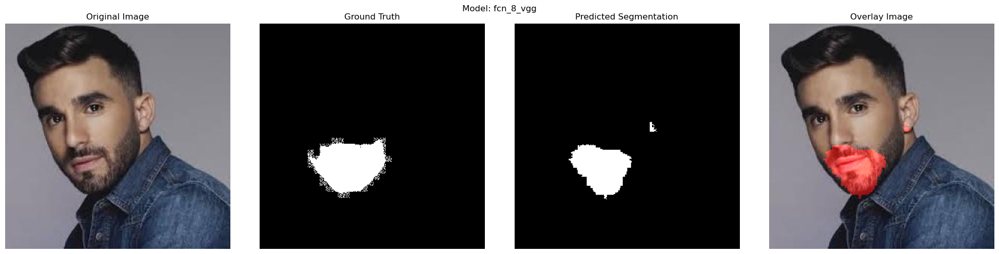

Loading and predicting with model pspnet...
Model path: /Users/nuno/programação/aprendizagem_visao/checkpoints/pspnet
Model prediction for pspnet...


2024-05-27 04:05:15.324596: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 812ms/step
Accuracy: 0.5088


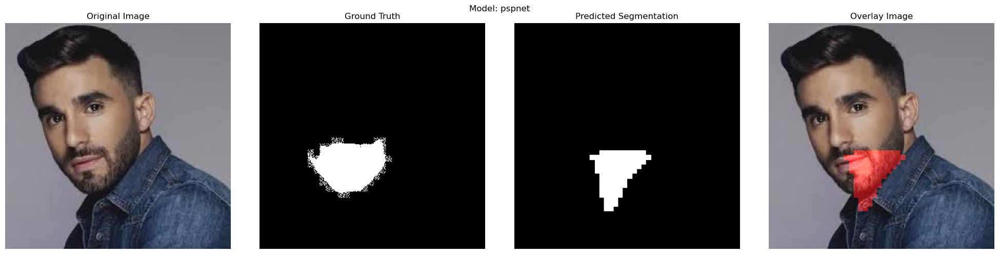

Loading and predicting with model mobilenet_unet...
Model path: /Users/nuno/programação/aprendizagem_visao/checkpoints/mobilenet_unet
Model prediction for mobilenet_unet...


2024-05-27 04:05:17.097700: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 596ms/step
Accuracy: 0.9499


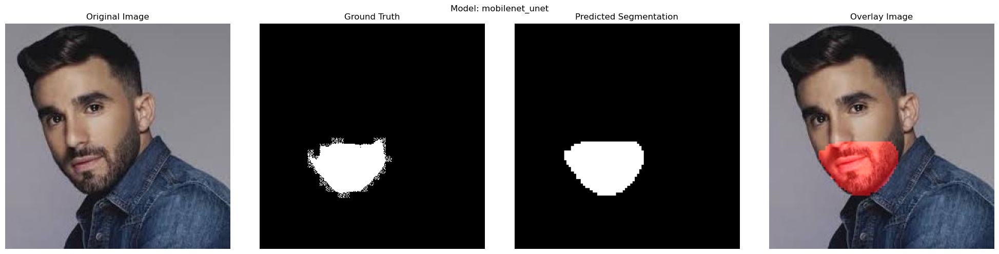

Loading and predicting with model vgg_segnet...
Model path: /Users/nuno/programação/aprendizagem_visao/checkpoints/vgg_segnet
Model prediction for vgg_segnet...


2024-05-27 04:05:18.095564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 518ms/step
Accuracy: 0.7651


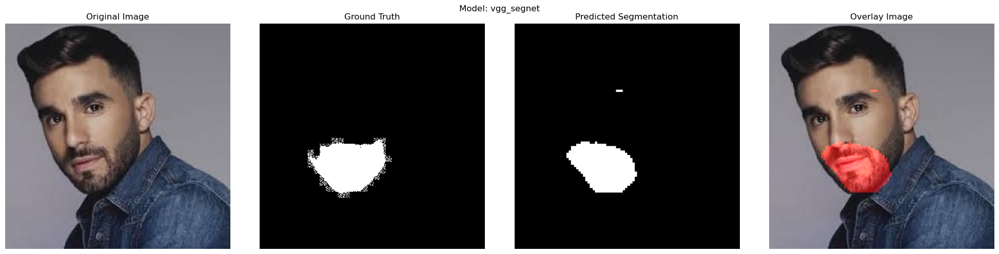

Loading and predicting with model mobilenet_segnet...
Model path: /Users/nuno/programação/aprendizagem_visao/checkpoints/mobilenet_segnet
Model prediction for mobilenet_segnet...


2024-05-27 04:05:20.191396: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 2s 2s/step
Accuracy: 0.7989


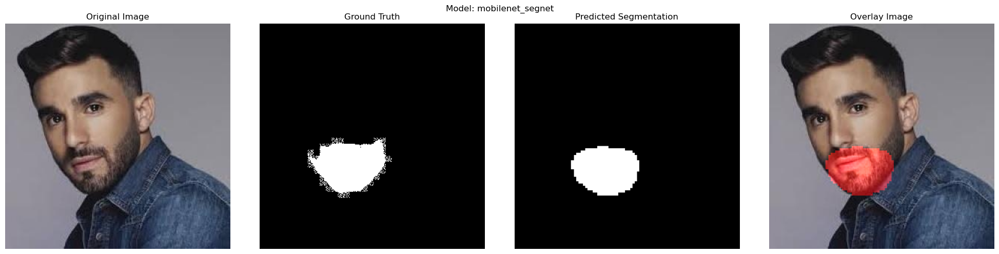

In [60]:
import os
import cv2
import matplotlib.pyplot as plt
from image_segmentation_keras.keras_segmentation.predict import predict
from image_segmentation_keras.keras_segmentation.models.all_models import model_from_name
import json
import numpy as np

# Define the paths
HOME = os.getcwd()  # Replace with the actual path if needed
IMAGE_PATH = os.path.join(HOME, 'dataset_final/test/images/33.jpg')
IMAGE_PATH_ANNO = os.path.join(HOME, 'dataset_final/test/label/33.jpg')

# Load the original image
original_image = cv2.imread(IMAGE_PATH)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Resize the original image to 224x224
resized_image = cv2.resize(original_image, (224, 224))

# Load the ground truth annotation
ground_truth = cv2.imread(IMAGE_PATH_ANNO, cv2.IMREAD_GRAYSCALE)
ground_truth = (ground_truth > 0).astype('uint8')

# Directory where the models are saved
checkpoint_path = os.path.join(HOME, 'checkpoints')

# List of model names to load
model_names = [
    "fcn_8_vgg",
    "pspnet",
    "mobilenet_unet",
    "vgg_segnet",
    "mobilenet_segnet"
]

# Loop over each model, load it, and perform prediction
for model_name in model_names:
    print(f"Loading and predicting with model {model_name}...")
    model_path = os.path.join(checkpoint_path, f"{model_name}")
    print(f"Model path: {model_path}")
    
    model_config = json.loads(open(model_path + "_config.json", "r").read())
    model = model_from_name[model_config['model_class']](
        model_config['n_classes'], input_height=model_config['input_height'],
        input_width=model_config['input_width'])
    model.load_weights(model_path + ".h5")
    
    print(f"Model prediction for {model_name}...")
    out = model.predict_segmentation(IMAGE_PATH)

    # Resize the predicted mask to match the original image size
    out_resized = cv2.resize(out, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)
    
    binary_mask = (out_resized > 0.5).astype('uint8')
    
    # Calculate the accuracy excluding the background
    foreground_mask = (ground_truth > 0).astype('uint8')
    correct_pixels = (binary_mask[foreground_mask == 1] == ground_truth[foreground_mask == 1]).astype('uint8')
    total_foreground_pixels = foreground_mask.sum()
    correct_foreground_pixel_count = correct_pixels.sum()
    accuracy = correct_foreground_pixel_count / total_foreground_pixels if total_foreground_pixels > 0 else 0
    
    # Print the accuracy
    print(f"\033[91mAccuracy: {accuracy:.4f}\033[0m")
    
    # Create a red mask for visualization
    red_mask = np.zeros_like(original_image)
    red_mask[:, :, 0] = binary_mask * 255  # Red channel
    
    # Overlay the red mask on the original image
    overlay_image = cv2.addWeighted(original_image, 1.0, red_mask, 0.5, 0)
        
    # Plot the original image, ground truth, and predicted segmentation
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(original_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(ground_truth, cmap='gray')
    axes[1].set_title('Ground Truth')
    axes[1].axis('off')
    
    axes[2].imshow(out_resized, cmap='gray')
    axes[2].set_title('Predicted Segmentation')
    axes[2].axis('off')
    
    axes[3].imshow(overlay_image)
    axes[3].set_title('Overlay Image')
    axes[3].axis('off')
    
    plt.suptitle(f"Model: {model_name}")
    plt.tight_layout()
    
    plt.show()

Found 608 images belonging to 1 classes.
Found 608 images belonging to 1 classes.
Found 152 images belonging to 1 classes.
Found 152 images belonging to 1 classes.
[[[[0.7960785  0.80392164 0.61960787]
   [0.80392164 0.8078432  0.6509804 ]
   [0.227451   0.21960786 0.12941177]
   ...
   [0.18039216 0.19607845 0.20784315]
   [0.20392159 0.21960786 0.22352943]
   [0.20784315 0.22352943 0.227451  ]]

  [[0.80392164 0.8117648  0.627451  ]
   [0.81568635 0.8196079  0.6627451 ]
   [0.25490198 0.24705884 0.15686275]
   ...
   [0.18431373 0.20000002 0.21176472]
   [0.20000002 0.21568629 0.21960786]
   [0.20784315 0.22352943 0.227451  ]]

  [[0.8196079  0.82745105 0.6431373 ]
   [0.8313726  0.8352942  0.6784314 ]
   [0.29803923 0.2901961  0.20000002]
   ...
   [0.1764706  0.19215688 0.20392159]
   [0.19607845 0.21176472 0.21568629]
   [0.22352943 0.2392157  0.24313727]]

  ...

  [[0.427451   0.40784317 0.24313727]
   [0.41176474 0.3921569  0.227451  ]
   [0.454902   0.43529415 0.2784314 ]
   .

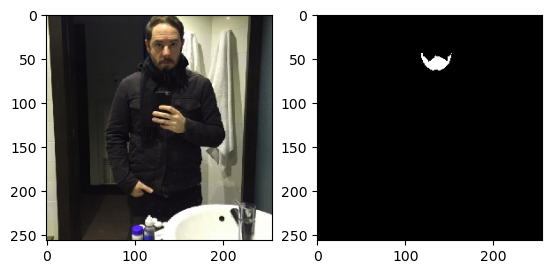

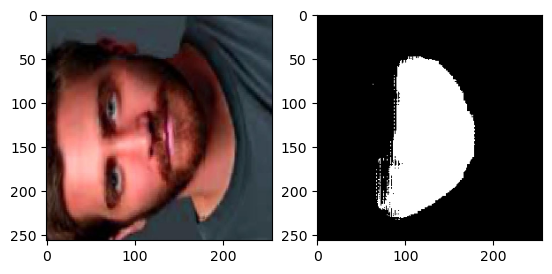

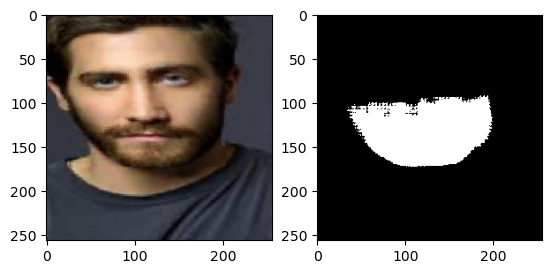

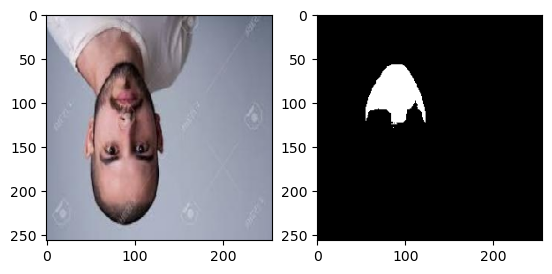

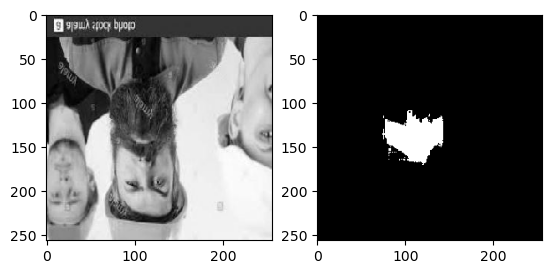

Epoch 1/50


2024-05-21 12:03:33.658183: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


38/38 [==============================] - ETA: 0s - loss: 0.7731 - dice_coeff: 0.2269 

2024-05-21 12:12:58.698997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2024-05-21 12:13:09.433397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 507ms/step


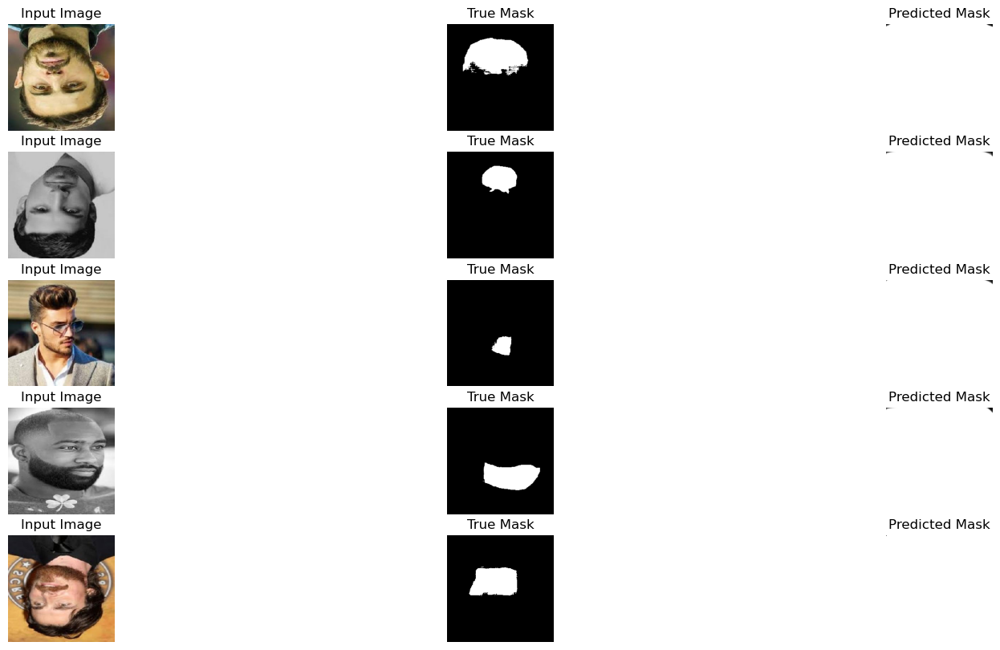

38/38 [==============================] - 579s 15s/step - loss: 0.7731 - dice_coeff: 0.2269 - val_loss: 0.8539 - val_dice_coeff: 0.1466
Epoch 2/50
38/38 [==============================] - 584s 15s/step - loss: 0.7123 - dice_coeff: 0.2877 - val_loss: 0.8438 - val_dice_coeff: 0.1542
Epoch 3/50
1/1 [==============================] - 0s 359ms/steposs: 0.6653 - dice_coeff: 0.334


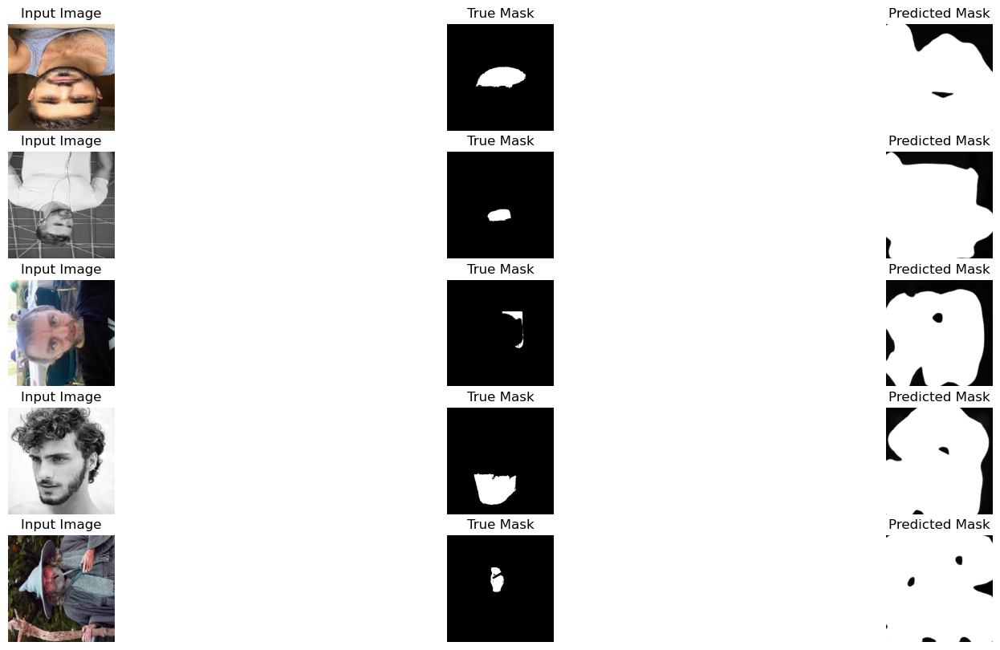

38/38 [==============================] - 560s 15s/step - loss: 0.6653 - dice_coeff: 0.3347 - val_loss: 0.8239 - val_dice_coeff: 0.1795
Epoch 4/50
38/38 [==============================] - 542s 14s/step - loss: 0.5987 - dice_coeff: 0.4013 - val_loss: 0.8007 - val_dice_coeff: 0.1960
Epoch 5/50
1/1 [==============================] - 0s 337ms/steposs: 0.5755 - dice_coeff: 0.424


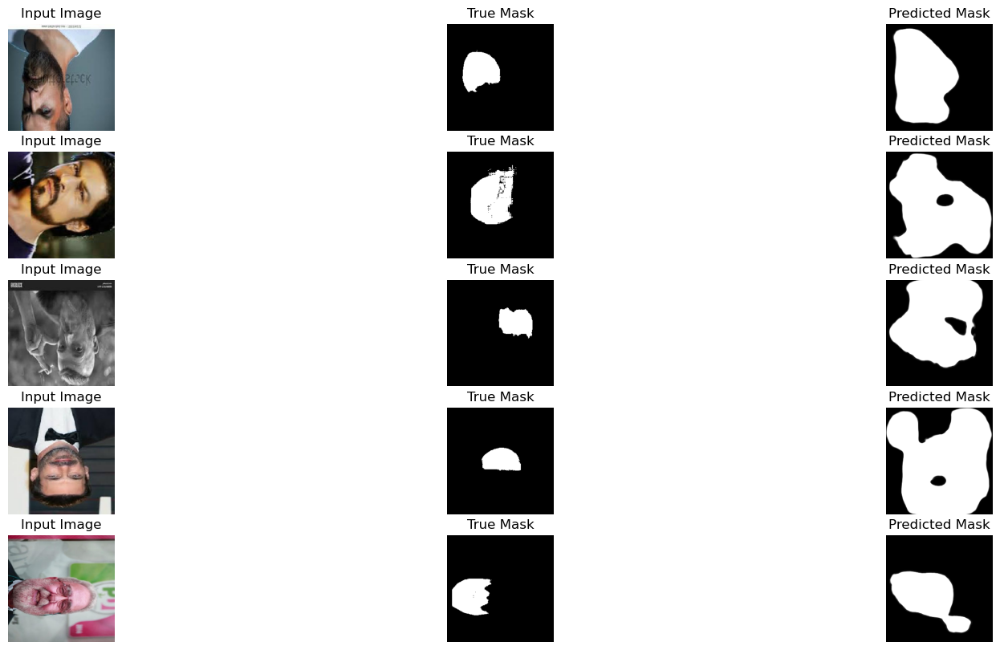

38/38 [==============================] - 522s 14s/step - loss: 0.5755 - dice_coeff: 0.4245 - val_loss: 0.7862 - val_dice_coeff: 0.2120
Epoch 6/50
38/38 [==============================] - 655s 17s/step - loss: 0.5423 - dice_coeff: 0.4577 - val_loss: 0.8073 - val_dice_coeff: 0.1970
Epoch 7/50
1/1 [==============================] - 0s 261ms/steposs: 0.5059 - dice_coeff: 0.494


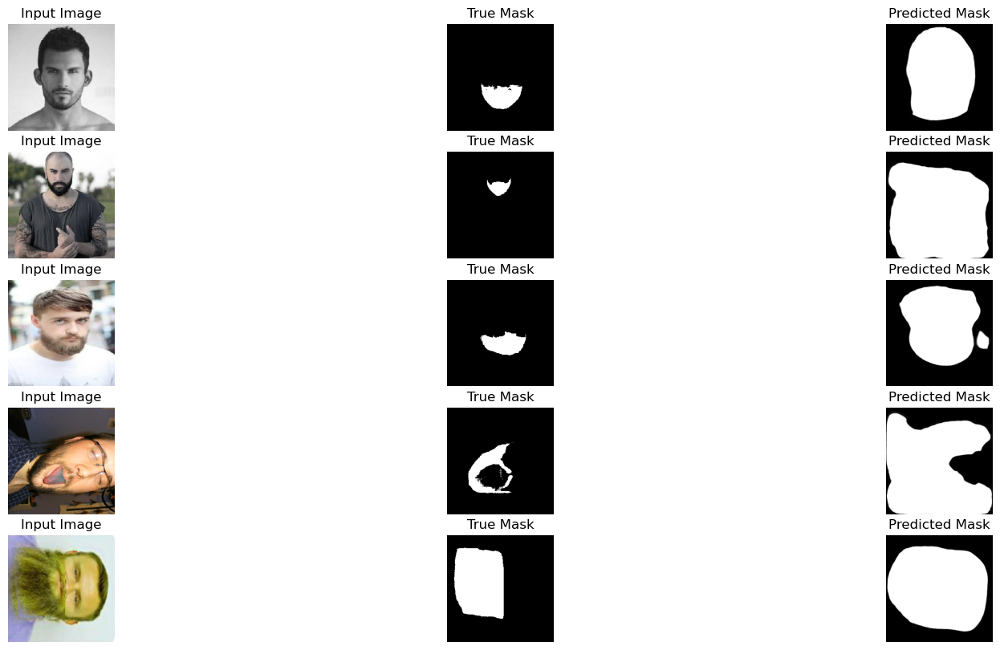

38/38 [==============================] - 566s 15s/step - loss: 0.5059 - dice_coeff: 0.4941 - val_loss: 0.7969 - val_dice_coeff: 0.2028
Epoch 8/50
38/38 [==============================] - 590s 16s/step - loss: 0.4984 - dice_coeff: 0.5016 - val_loss: 0.6951 - val_dice_coeff: 0.3042
Epoch 9/50
1/1 [==============================] - 0s 86ms/steploss: 0.4898 - dice_coeff: 0.510


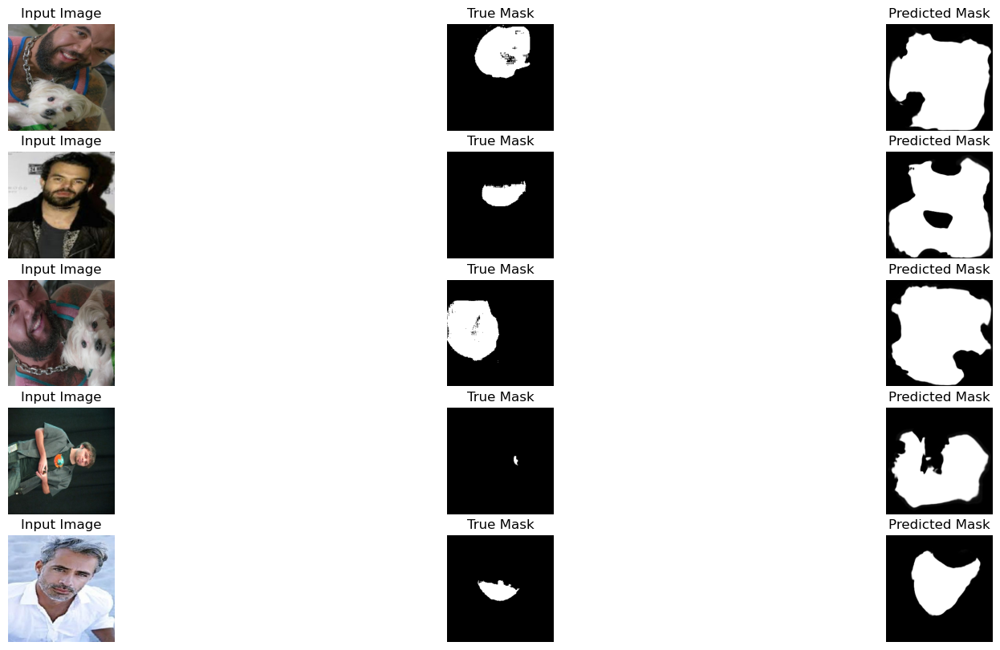

38/38 [==============================] - 626s 17s/step - loss: 0.4898 - dice_coeff: 0.5102 - val_loss: 0.7524 - val_dice_coeff: 0.2445
Epoch 10/50
38/38 [==============================] - 639s 17s/step - loss: 0.4762 - dice_coeff: 0.5238 - val_loss: 0.7994 - val_dice_coeff: 0.2092
Epoch 11/50
1/1 [==============================] - 0s 422ms/steposs: 0.4402 - dice_coeff: 0.559


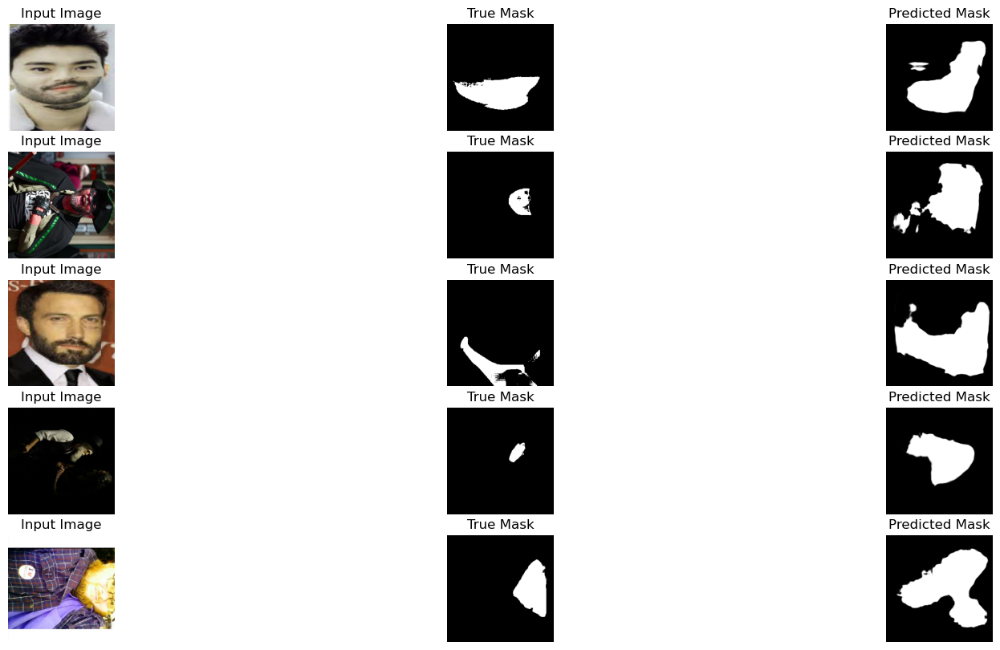

38/38 [==============================] - 710s 19s/step - loss: 0.4402 - dice_coeff: 0.5598 - val_loss: 0.6650 - val_dice_coeff: 0.3343
Epoch 12/50
38/38 [==============================] - 708s 18s/step - loss: 0.4374 - dice_coeff: 0.5626 - val_loss: 0.6783 - val_dice_coeff: 0.3283
Epoch 13/50
1/1 [==============================] - 1s 1s/step- loss: 0.4258 - dice_coeff: 0.574


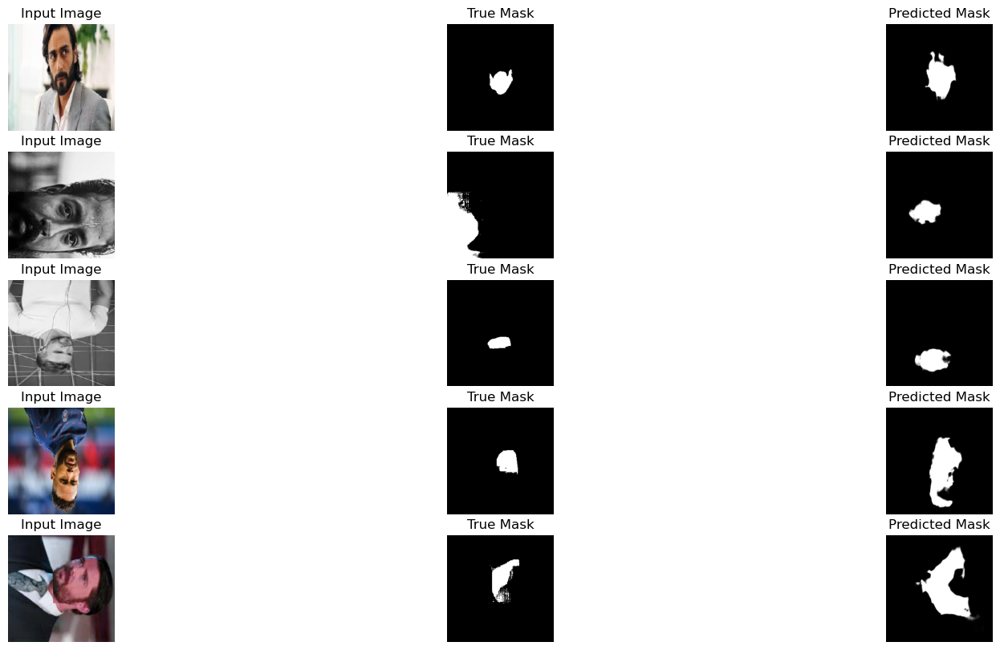

38/38 [==============================] - 604s 16s/step - loss: 0.4258 - dice_coeff: 0.5742 - val_loss: 0.4891 - val_dice_coeff: 0.5022
Epoch 14/50
38/38 [==============================] - 729s 19s/step - loss: 0.3884 - dice_coeff: 0.6116 - val_loss: 0.4457 - val_dice_coeff: 0.5580
Epoch 15/50
1/1 [==============================] - 0s 202ms/steposs: 0.3773 - dice_coeff: 0.622


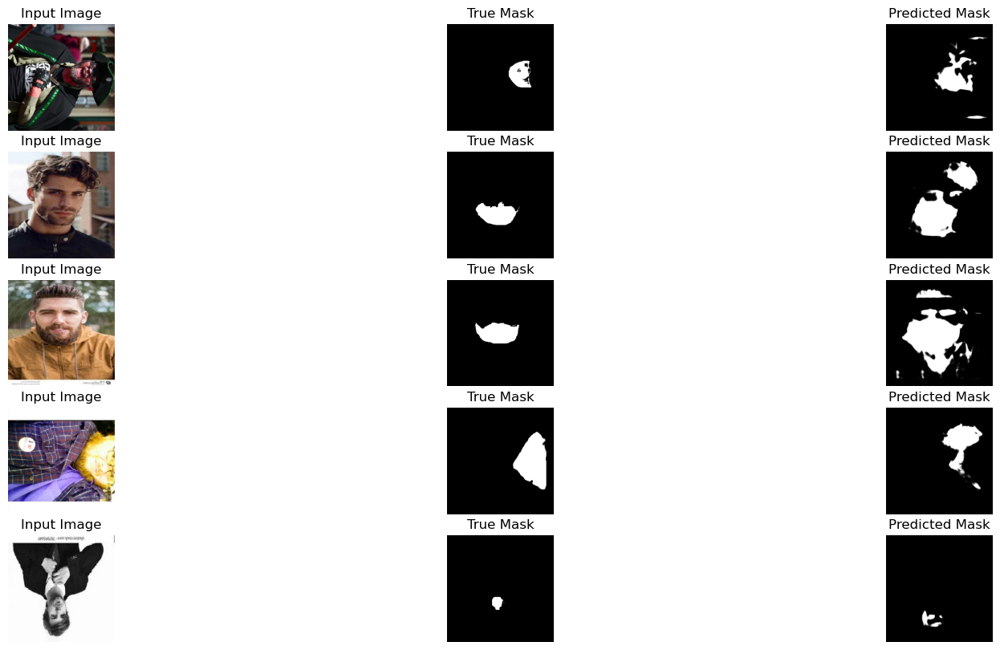

38/38 [==============================] - 690s 18s/step - loss: 0.3773 - dice_coeff: 0.6227 - val_loss: 0.4910 - val_dice_coeff: 0.5139
Epoch 16/50
38/38 [==============================] - 729s 19s/step - loss: 0.3909 - dice_coeff: 0.6091 - val_loss: 0.6252 - val_dice_coeff: 0.3739
Epoch 17/50
1/1 [==============================] - 0s 143ms/steposs: 0.3728 - dice_coeff: 0.627


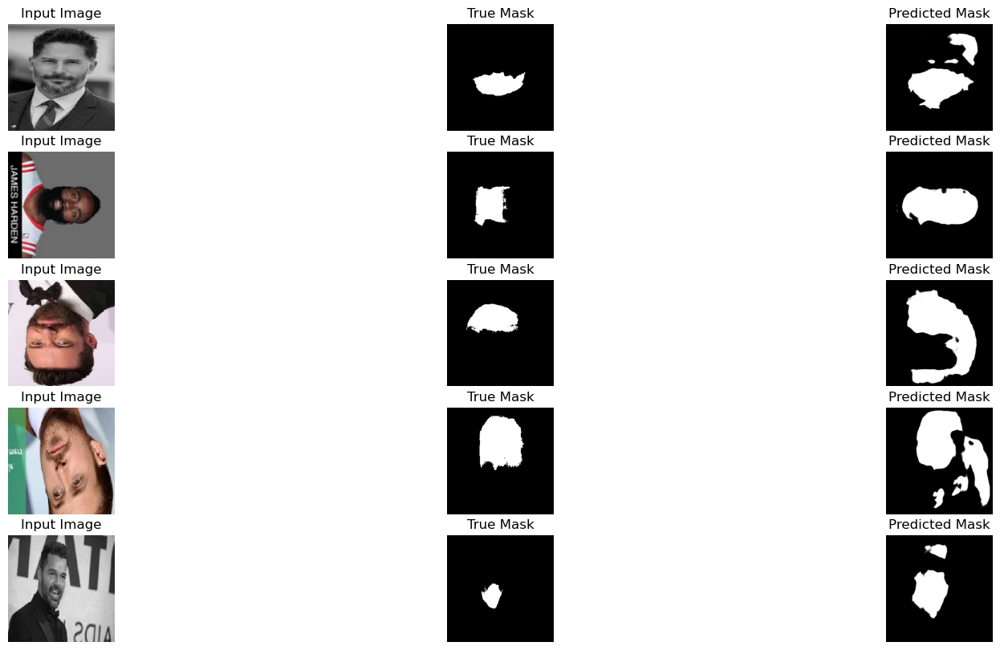

38/38 [==============================] - 687s 18s/step - loss: 0.3728 - dice_coeff: 0.6272 - val_loss: 0.5915 - val_dice_coeff: 0.4069
Epoch 18/50
38/38 [==============================] - 663s 17s/step - loss: 0.3832 - dice_coeff: 0.6168 - val_loss: 0.5207 - val_dice_coeff: 0.4872
Epoch 19/50
1/1 [==============================] - 0s 336ms/steposs: 0.3499 - dice_coeff: 0.650


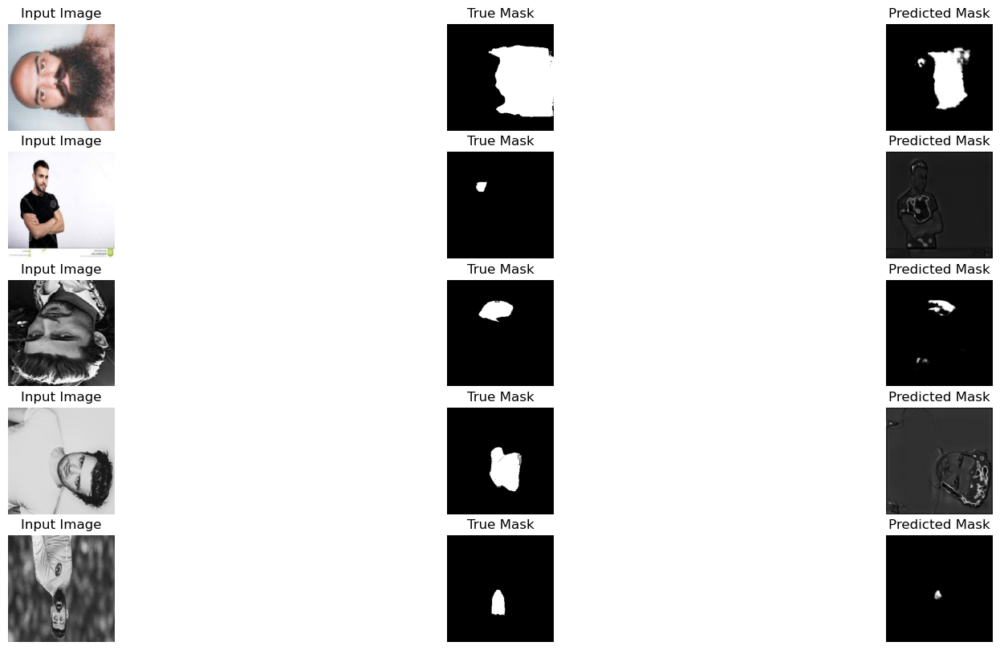

38/38 [==============================] - 747s 20s/step - loss: 0.3499 - dice_coeff: 0.6501 - val_loss: 0.4160 - val_dice_coeff: 0.5890
Epoch 20/50
38/38 [==============================] - 663s 17s/step - loss: 0.3472 - dice_coeff: 0.6528 - val_loss: 0.4834 - val_dice_coeff: 0.5037
Epoch 21/50
1/1 [==============================] - 0s 331ms/steposs: 0.3397 - dice_coeff: 0.660


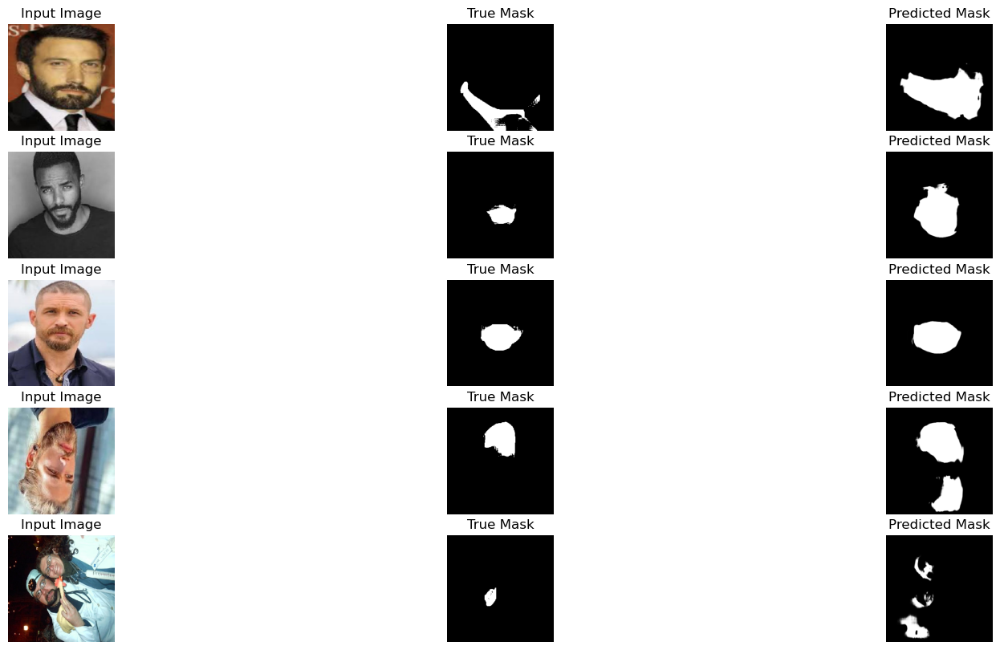

38/38 [==============================] - 615s 16s/step - loss: 0.3397 - dice_coeff: 0.6603 - val_loss: 0.5101 - val_dice_coeff: 0.4880
Epoch 22/50
38/38 [==============================] - 597s 16s/step - loss: 0.3134 - dice_coeff: 0.6866 - val_loss: 0.3932 - val_dice_coeff: 0.6098
Epoch 23/50
1/1 [==============================] - 0s 232ms/steposs: 0.3204 - dice_coeff: 0.679


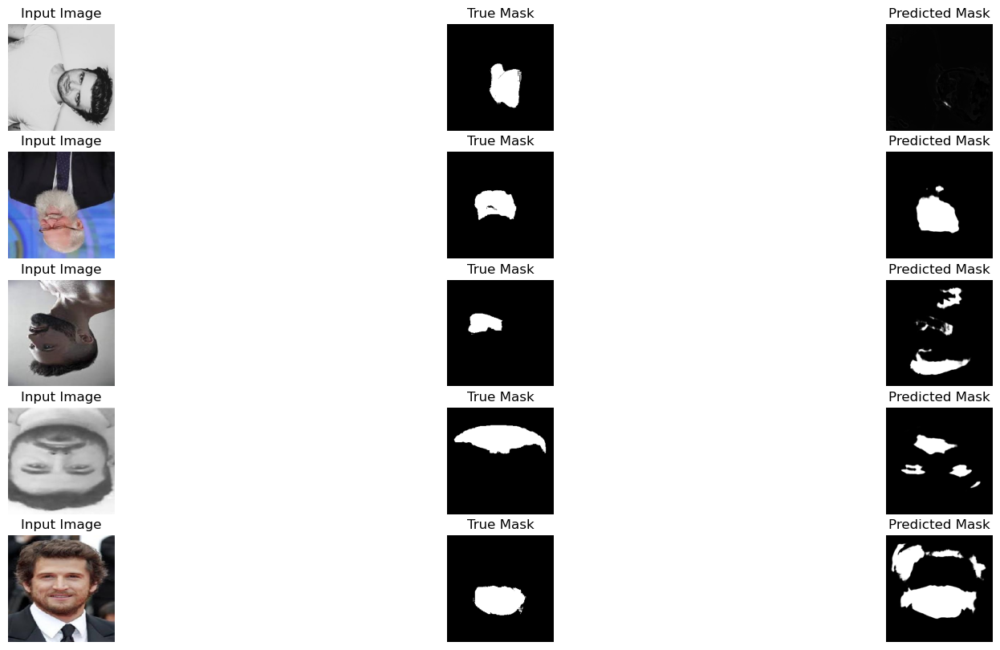

38/38 [==============================] - 681s 18s/step - loss: 0.3204 - dice_coeff: 0.6796 - val_loss: 0.4286 - val_dice_coeff: 0.5687
Epoch 24/50
38/38 [==============================] - 688s 18s/step - loss: 0.3113 - dice_coeff: 0.6887 - val_loss: 0.5136 - val_dice_coeff: 0.4911
Epoch 25/50
1/1 [==============================] - 0s 128ms/steposs: 0.2943 - dice_coeff: 0.705


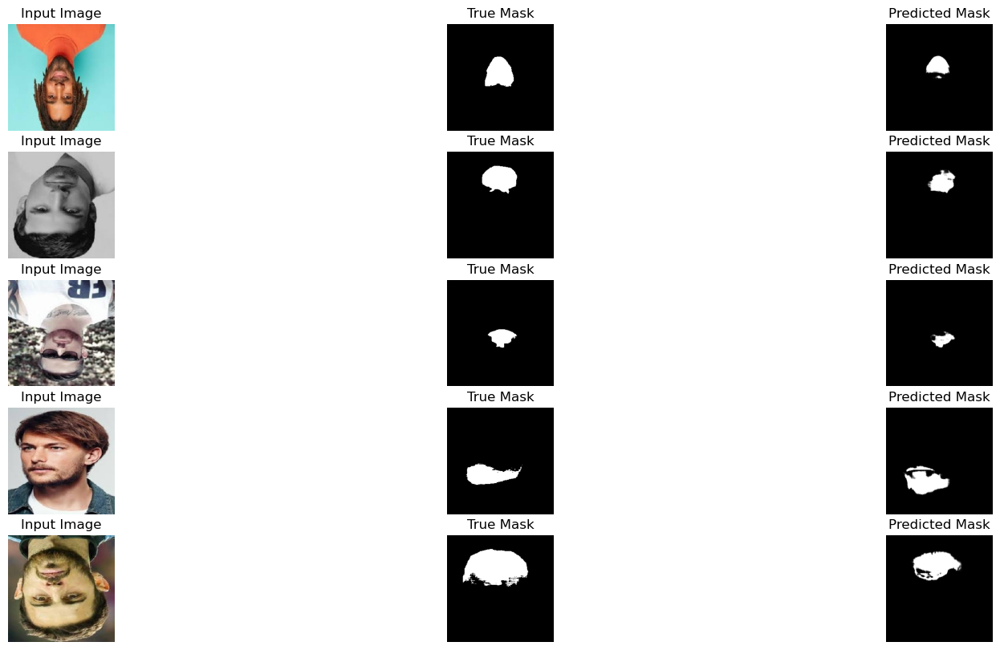

38/38 [==============================] - 616s 16s/step - loss: 0.2943 - dice_coeff: 0.7057 - val_loss: 0.4571 - val_dice_coeff: 0.5432
Epoch 26/50
38/38 [==============================] - 641s 17s/step - loss: 0.3002 - dice_coeff: 0.6998 - val_loss: 0.3811 - val_dice_coeff: 0.6174
Epoch 27/50
1/1 [==============================] - 1s 675ms/steposs: 0.2830 - dice_coeff: 0.717


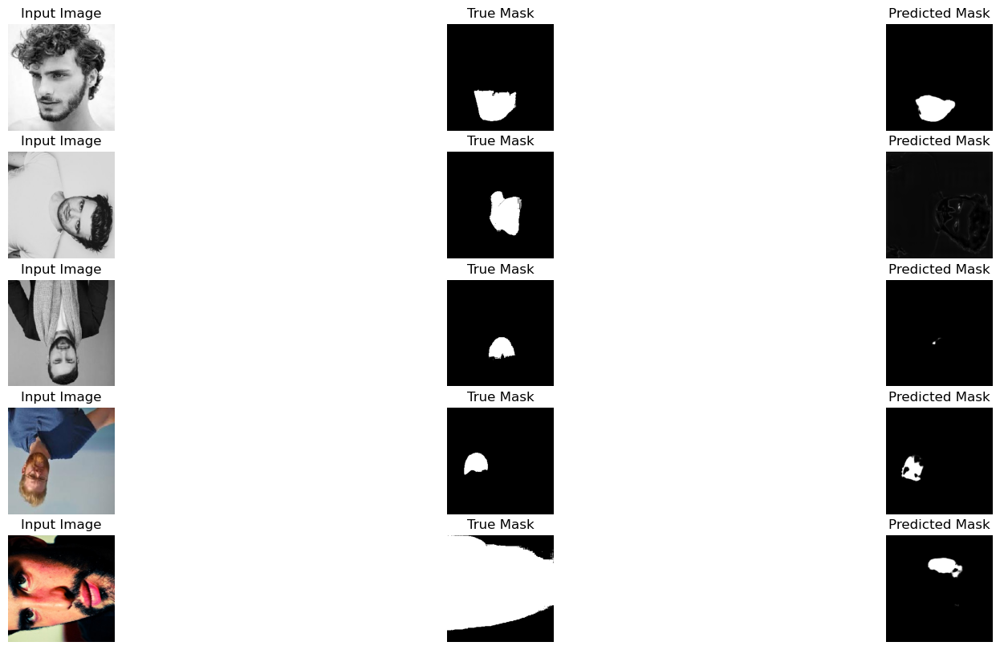

38/38 [==============================] - 595s 16s/step - loss: 0.2830 - dice_coeff: 0.7170 - val_loss: 0.3771 - val_dice_coeff: 0.6199
Epoch 28/50
38/38 [==============================] - 676s 18s/step - loss: 0.2733 - dice_coeff: 0.7267 - val_loss: 0.4204 - val_dice_coeff: 0.5733
Epoch 29/50
1/1 [==============================] - 0s 128ms/steposs: 0.2668 - dice_coeff: 0.733


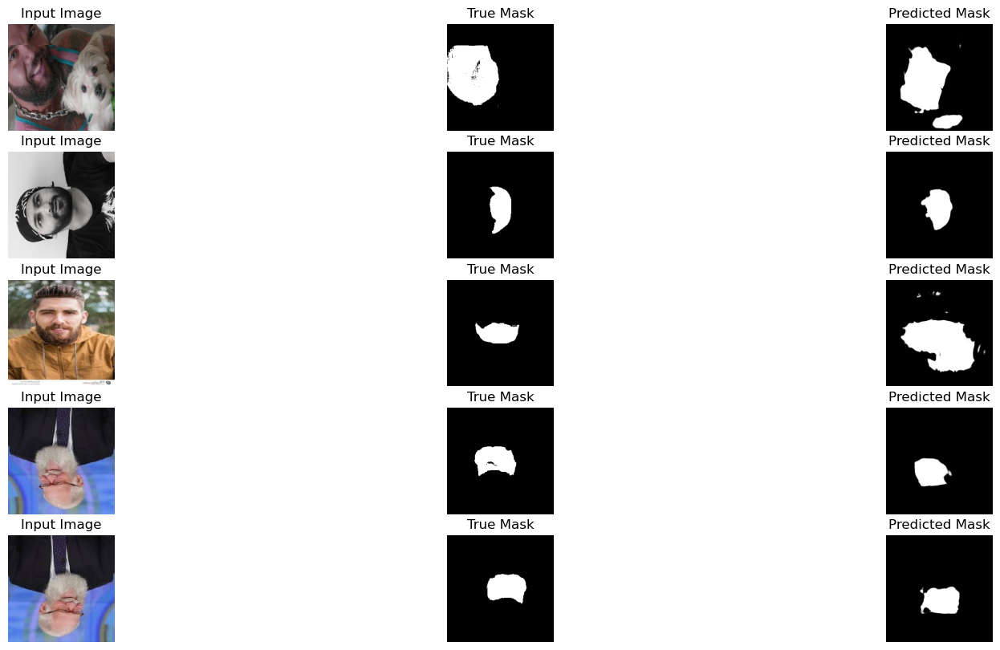

38/38 [==============================] - 643s 17s/step - loss: 0.2668 - dice_coeff: 0.7332 - val_loss: 0.4131 - val_dice_coeff: 0.5858
Epoch 30/50
38/38 [==============================] - 583s 15s/step - loss: 0.2823 - dice_coeff: 0.7177 - val_loss: 0.4014 - val_dice_coeff: 0.5892
Epoch 31/50
1/1 [==============================] - 0s 119ms/steposs: 0.2508 - dice_coeff: 0.749


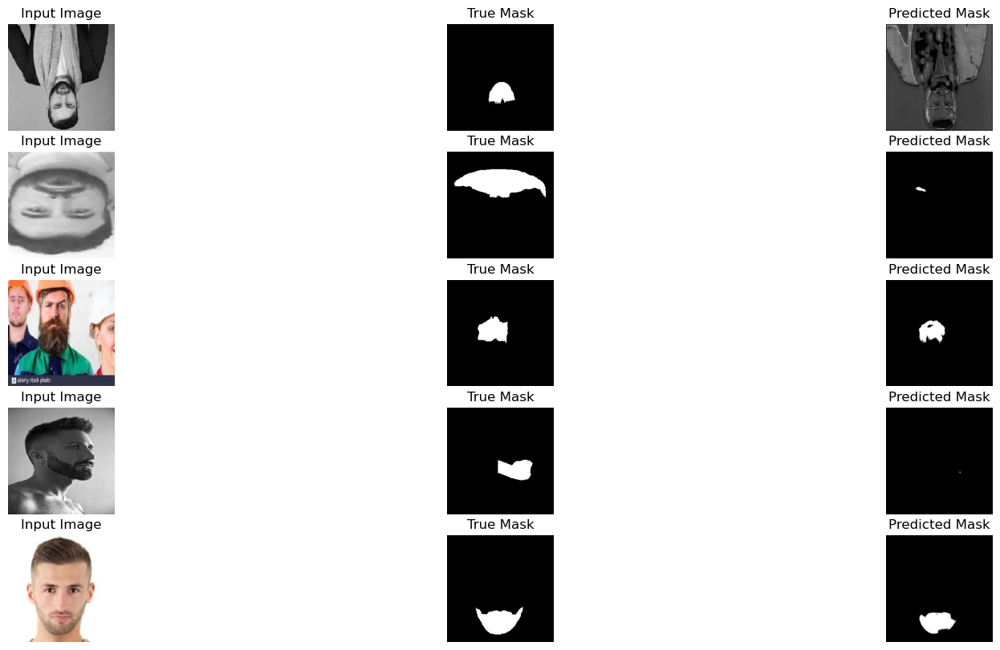

38/38 [==============================] - 603s 16s/step - loss: 0.2508 - dice_coeff: 0.7492 - val_loss: 0.5537 - val_dice_coeff: 0.4432
Epoch 32/50
38/38 [==============================] - 545s 14s/step - loss: 0.2588 - dice_coeff: 0.7412 - val_loss: 0.3834 - val_dice_coeff: 0.6219
Epoch 33/50
1/1 [==============================] - 0s 371ms/steposs: 0.2481 - dice_coeff: 0.751


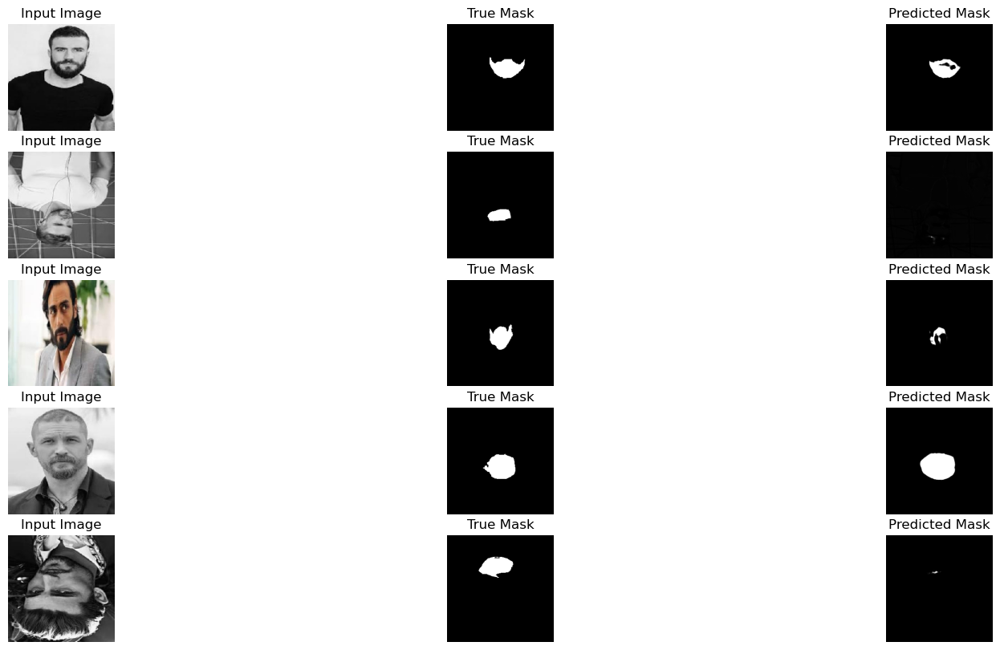

38/38 [==============================] - 691s 18s/step - loss: 0.2481 - dice_coeff: 0.7519 - val_loss: 0.4878 - val_dice_coeff: 0.5136
Epoch 34/50
38/38 [==============================] - 679s 18s/step - loss: 0.2541 - dice_coeff: 0.7459 - val_loss: 0.3598 - val_dice_coeff: 0.6397
Epoch 35/50
1/1 [==============================] - 0s 148ms/steposs: 0.2424 - dice_coeff: 0.757


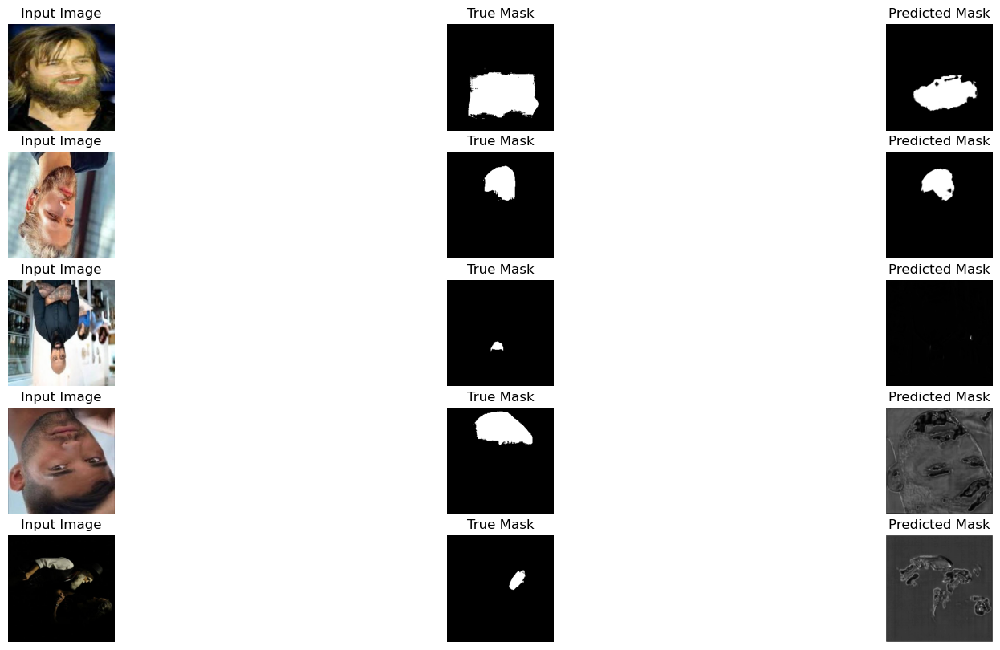

38/38 [==============================] - 608s 16s/step - loss: 0.2424 - dice_coeff: 0.7576 - val_loss: 0.4363 - val_dice_coeff: 0.5739
Epoch 36/50
38/38 [==============================] - 452s 12s/step - loss: 0.2515 - dice_coeff: 0.7485 - val_loss: 0.3876 - val_dice_coeff: 0.6185
Epoch 37/50
1/1 [==============================] - 0s 108ms/steposs: 0.2288 - dice_coeff: 0.771


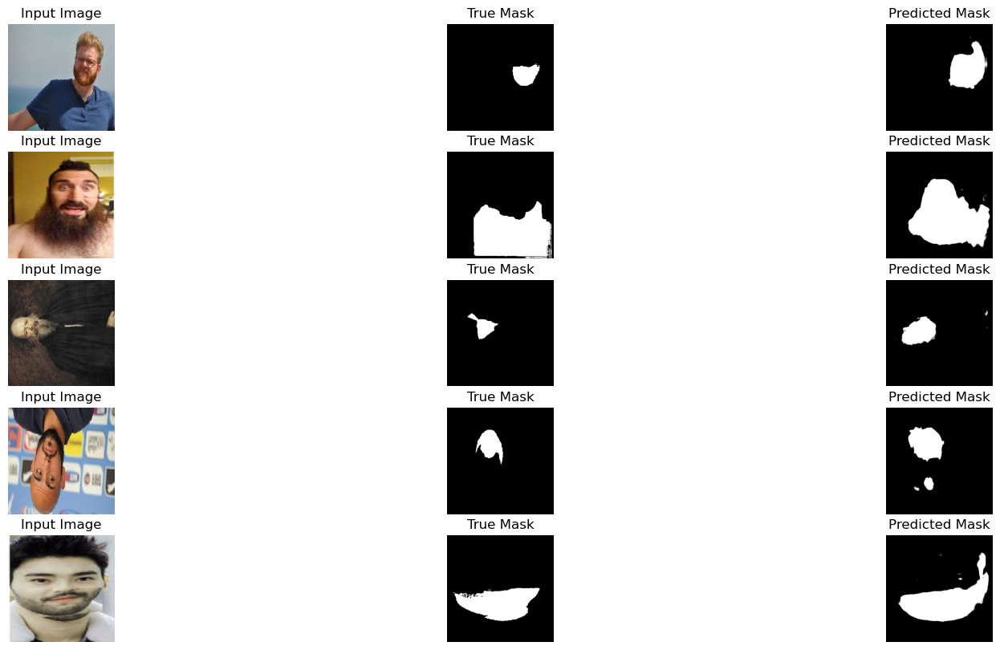

38/38 [==============================] - 398s 11s/step - loss: 0.2288 - dice_coeff: 0.7712 - val_loss: 0.3894 - val_dice_coeff: 0.6109
Epoch 38/50
38/38 [==============================] - 362s 10s/step - loss: 0.2224 - dice_coeff: 0.7776 - val_loss: 0.3506 - val_dice_coeff: 0.6506
Epoch 39/50
1/1 [==============================] - 0s 106ms/steposs: 0.2243 - dice_coeff: 0.77


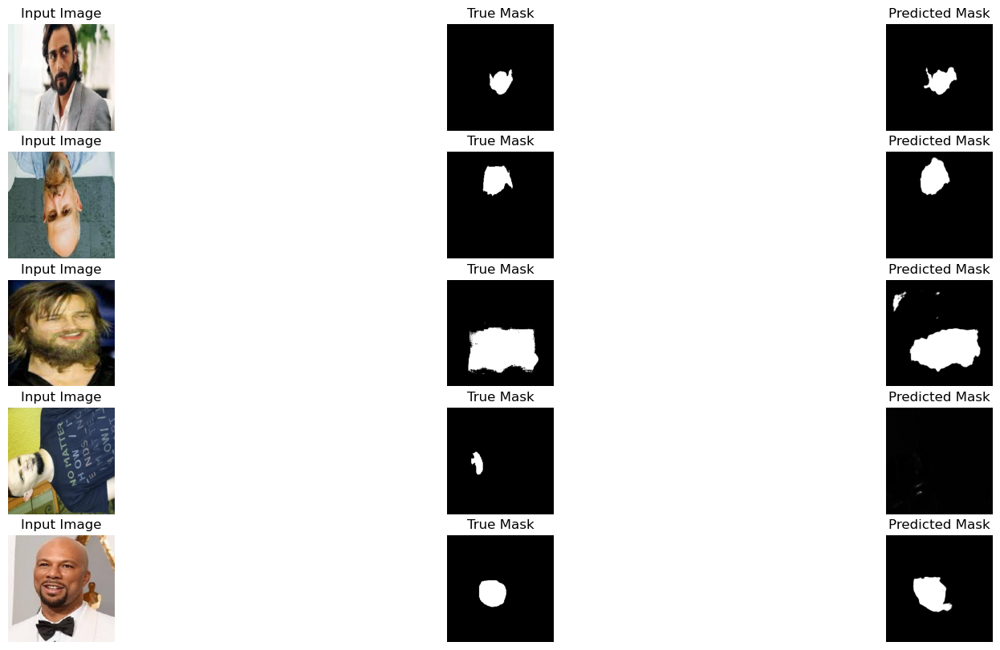

38/38 [==============================] - 366s 10s/step - loss: 0.2243 - dice_coeff: 0.7757 - val_loss: 0.3565 - val_dice_coeff: 0.6438
Epoch 40/50
38/38 [==============================] - 415s 11s/step - loss: 0.2192 - dice_coeff: 0.7808 - val_loss: 0.3600 - val_dice_coeff: 0.6386
Epoch 41/50
1/1 [==============================] - 0s 176ms/steposs: 0.2076 - dice_coeff: 0.79


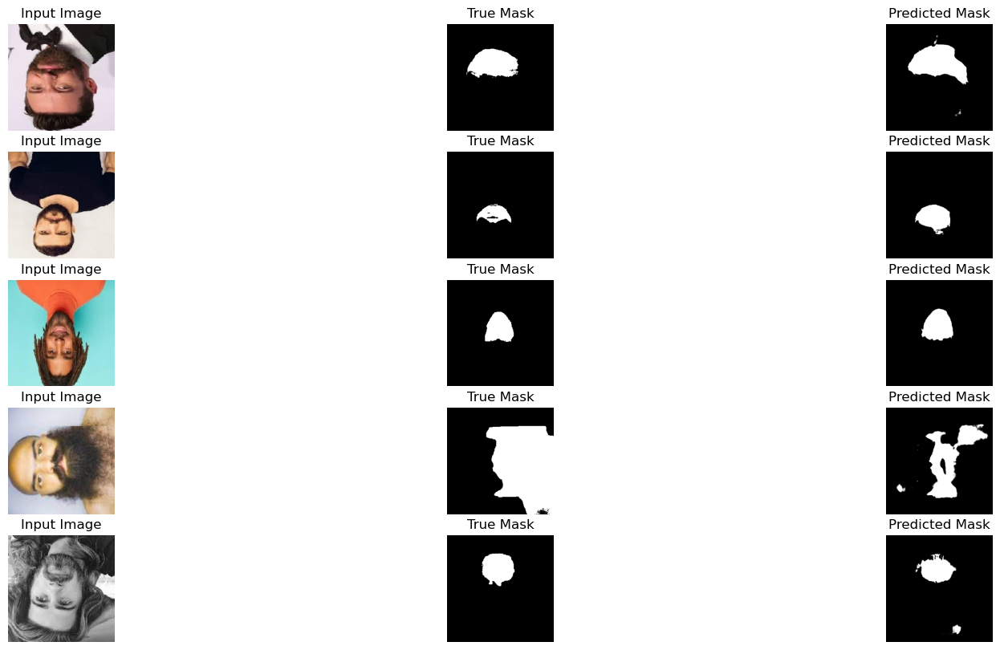

38/38 [==============================] - 365s 10s/step - loss: 0.2076 - dice_coeff: 0.7924 - val_loss: 0.3427 - val_dice_coeff: 0.6587
Epoch 42/50
38/38 [==============================] - 398s 10s/step - loss: 0.2152 - dice_coeff: 0.7848 - val_loss: 0.3585 - val_dice_coeff: 0.6399
Epoch 43/50
1/1 [==============================] - 0s 197ms/steposs: 0.2085 - dice_coeff: 0.79


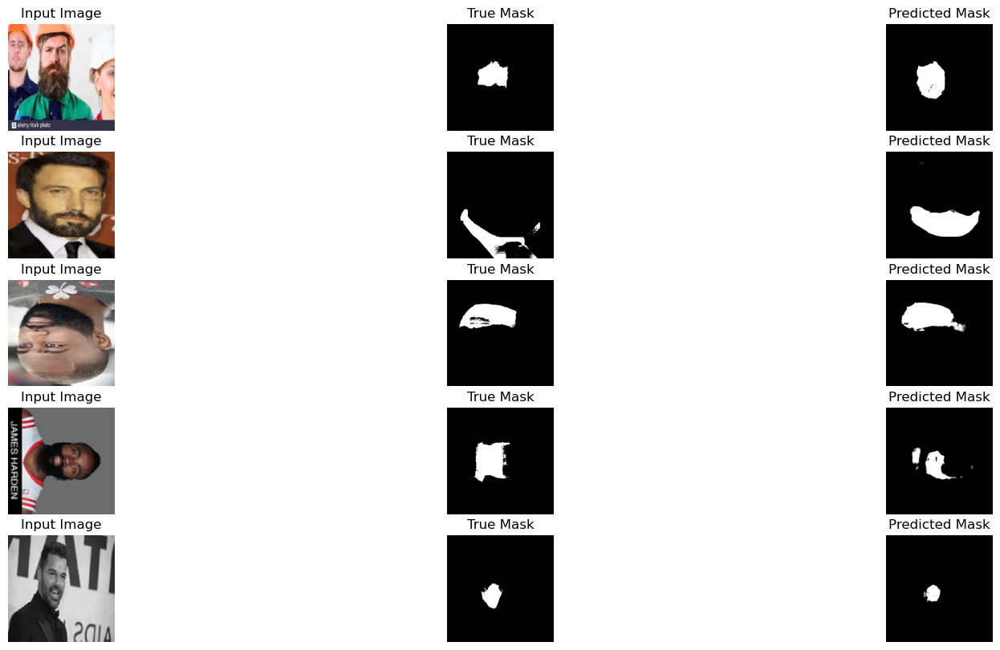

38/38 [==============================] - 363s 10s/step - loss: 0.2085 - dice_coeff: 0.7915 - val_loss: 0.3375 - val_dice_coeff: 0.6475
Epoch 44/50
38/38 [==============================] - 353s 9s/step - loss: 0.1965 - dice_coeff: 0.8035 - val_loss: 0.4199 - val_dice_coeff: 0.5677
Epoch 45/50
1/1 [==============================] - 0s 189ms/steposs: 0.1945 - dice_coeff: 0.80


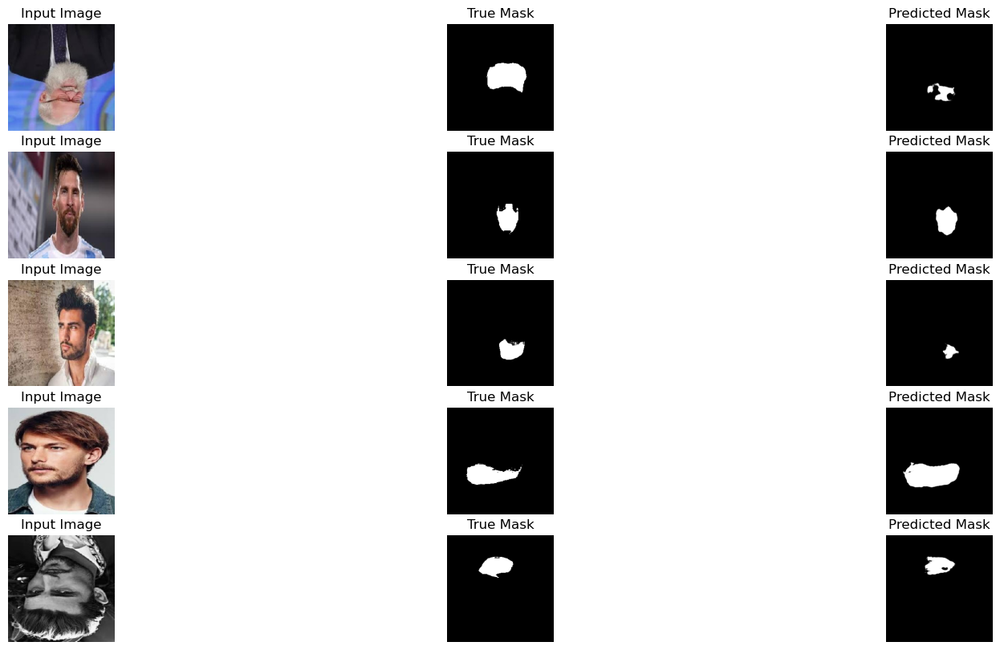

38/38 [==============================] - 370s 10s/step - loss: 0.1945 - dice_coeff: 0.8055 - val_loss: 0.3775 - val_dice_coeff: 0.6214
Epoch 46/50
38/38 [==============================] - 5276s 142s/step - loss: 0.1814 - dice_coeff: 0.8186 - val_loss: 0.3462 - val_dice_coeff: 0.6557
Epoch 47/50
1/1 [==============================] - 0s 283ms/steposs: 0.2166 - dice_coeff: 0.783


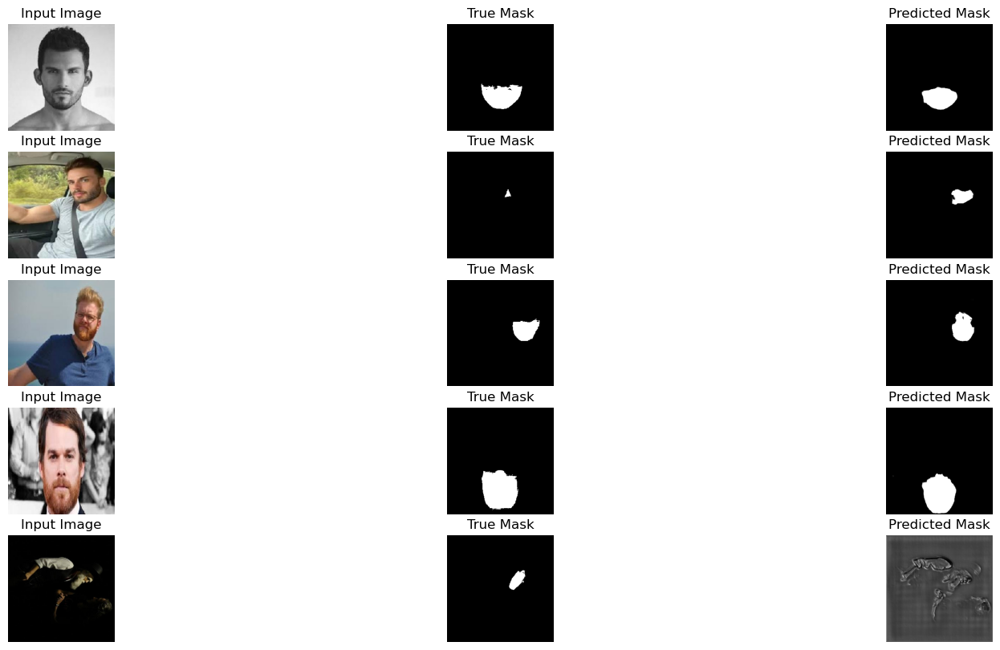

38/38 [==============================] - 545s 14s/step - loss: 0.2166 - dice_coeff: 0.7834 - val_loss: 0.3269 - val_dice_coeff: 0.6718
Epoch 48/50
38/38 [==============================] - 699s 18s/step - loss: 0.1827 - dice_coeff: 0.8173 - val_loss: 0.4276 - val_dice_coeff: 0.5816
Epoch 49/50
1/1 [==============================] - 0s 114ms/steposs: 0.1736 - dice_coeff: 0.826


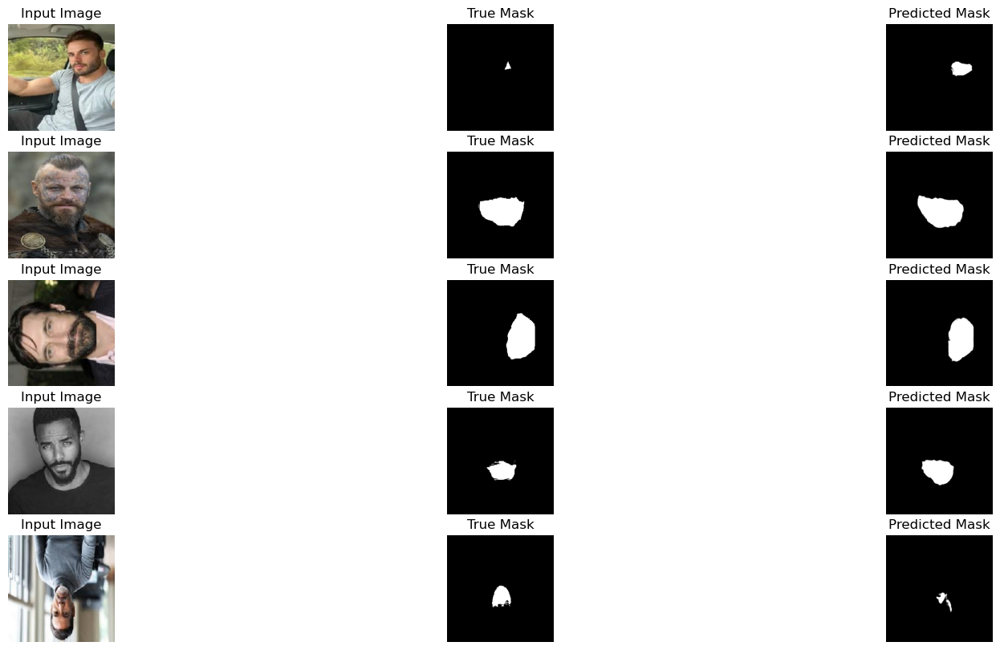

38/38 [==============================] - 632s 17s/step - loss: 0.1736 - dice_coeff: 0.8264 - val_loss: 0.3832 - val_dice_coeff: 0.6191
Epoch 50/50
38/38 [==============================] - 684s 18s/step - loss: 0.1790 - dice_coeff: 0.8210 - val_loss: 0.3207 - val_dice_coeff: 0.6822


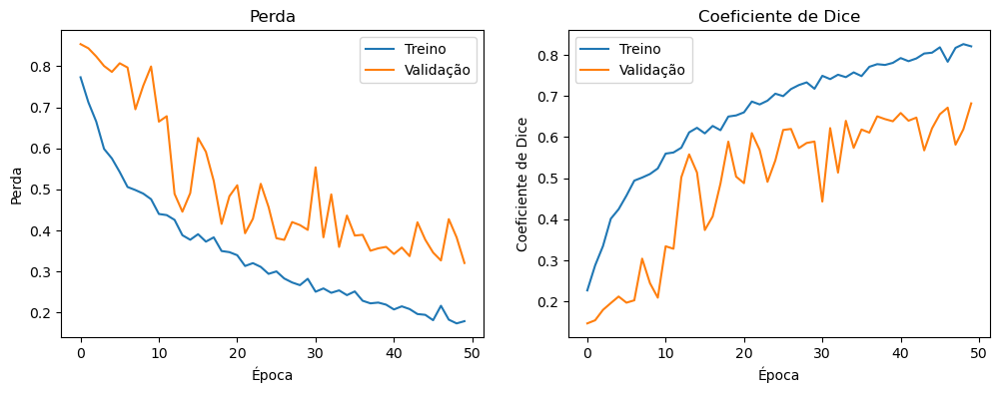

In [11]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, ModelCheckpoint
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, Dropout, BatchNormalization, Activation, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt

# Diretórios das imagens de treino e validação
train_image_dir = os.path.join(HOME, 'dataset_final/train')
val_image_dir = os.path.join(HOME, 'dataset_final/validation')

# Definição do tamanho das imagens, tamanho do lote e semente aleatória
img_size = 256
batch_size = 16
seed = 100

# Gerador de imagens e máscaras
def my_image_mask_generator(image_data_generator, mask_data_generator):
    for (img, mask) in zip(image_data_generator, mask_data_generator):
        yield (img, mask)

# Define geradores de dados de imagem
image_data_generator = ImageDataGenerator(rescale=1/255.0)
mask_data_generator = ImageDataGenerator(rescale=1/255.0)

# Gerador de imagens de treino
train_image_generator = image_data_generator.flow_from_directory(
    train_image_dir,
    classes=['images'],
    batch_size=batch_size,
    target_size=(img_size, img_size),
    seed=seed,
    class_mode=None
)

# Gerador de máscaras de treino
train_mask_generator = mask_data_generator.flow_from_directory(
    train_image_dir,
    classes=['labels'],
    batch_size=batch_size,
    target_size=(img_size, img_size),
    seed=seed,
    class_mode=None,
    color_mode='grayscale'
)

# Gerador de imagens de validação
val_image_generator = image_data_generator.flow_from_directory(
    val_image_dir,
    classes=['images'],
    batch_size=batch_size,
    target_size=(img_size, img_size),
    seed=seed,
    class_mode=None
)

# Gerador de máscaras de validação
val_mask_generator = mask_data_generator.flow_from_directory(
    val_image_dir,
    classes=['labels'],
    batch_size=batch_size,
    target_size=(img_size, img_size),
    seed=seed,
    class_mode=None,
    color_mode='grayscale'
)

# Gerador de treino que combina imagens e máscaras
train_generator = my_image_mask_generator(train_image_generator, train_mask_generator)
val_generator = my_image_mask_generator(val_image_generator, val_mask_generator)

# Exibir algumas imagens e máscaras de treino
for images, masks in train_generator:
    print(images, masks.shape)
    for i in range(5):
        plt.subplot(1, 2, 1)
        plt.imshow(images[i])
        plt.subplot(1, 2, 2)
        plt.imshow(masks[i].squeeze(), cmap='gray')
        plt.show()
    break

# Callback para exibir previsões durante o treino
class DisplayPredictions(Callback):
    def __init__(self, val_generator, num_images=5, epoch_interval=1):
        self.val_generator = val_generator
        self.num_images = num_images
        self.epoch_interval = epoch_interval

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.epoch_interval == 0:
            val_images, val_masks = next(val_generator)
            preds = self.model.predict(val_images)

            plt.figure(figsize=(20, 10))
            for i in range(self.num_images):
                plt.subplot(self.num_images, 3, i*3 + 1)
                plt.imshow(val_images[i])
                plt.title('Input Image')
                plt.axis('off')

                plt.subplot(self.num_images, 3, i*3 + 2)
                plt.imshow(val_masks[i].squeeze(), cmap='gray')
                plt.title('True Mask')
                plt.axis('off')

                plt.subplot(self.num_images, 3, i*3 + 3)
                plt.imshow(preds[i].squeeze(), cmap='gray')
                plt.title('Predicted Mask')
                plt.axis('off')

            plt.show()

# Definição do coeficiente de Dice
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

# Definição da perda de Dice
def dice_loss(y_true, y_pred):
    return 1 - dice_coeff(y_true, y_pred)

# Bloco de convolução
def conv_block(tensor, nfilters, size=3, padding='same', initializer='he_normal'):
    x = Conv2D(nfilters, (size, size), padding=padding, kernel_initializer=initializer)(tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(nfilters, (size, size), padding=padding, kernel_initializer=initializer)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

# Bloco de decodificação
def deconv_block(tensor, residual, nfilters, size=3, padding='same', strides=(2, 2)):
    y = Conv2DTranspose(nfilters, (size, size), strides=strides, padding=padding)(tensor)
    y = concatenate([y, residual], axis=3)
    y = conv_block(y, nfilters)
    return y

# Definição do modelo U-Net
def build_unet(img_size, nfilters=64):
    input_layer = Input(shape=(img_size, img_size, 3))
    
    # Codificação
    c1 = conv_block(input_layer, nfilters)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.3)(p1)
    
    c2 = conv_block(p1, nfilters*2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.3)(p2)
    
    c3 = conv_block(p2, nfilters*4)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.3)(p3)
    
    c4 = conv_block(p3, nfilters*8)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.3)(p4)
    
    c5 = conv_block(p4, nfilters*16)
    
    # Decodificação
    d6 = deconv_block(c5, c4, nfilters*8)
    d6 = Dropout(0.3)(d6)
    
    d7 = deconv_block(d6, c3, nfilters*4)
    d7 = Dropout(0.3)(d7)
    
    d8 = deconv_block(d7, c2, nfilters*2)
    d8 = Dropout(0.3)(d8)
    
    d9 = deconv_block(d8, c1, nfilters)
    d9 = Dropout(0.3)(d9)
    
    output_layer = Conv2D(1, (1, 1), activation='sigmoid')(d9)
    
    model = Model(inputs=input_layer, outputs=output_layer)
    return model

# Construção do modelo
model = build_unet(img_size, nfilters=64)
model.compile(optimizer=Adam(), loss=dice_loss, metrics=[dice_coeff])
# unet_model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Definição de callbacks
checkpoint = ModelCheckpoint('unet_model.h5', save_best_only=True)
display_predictions = DisplayPredictions(val_generator, num_images=5, epoch_interval=2)

# Treino do modelo
history = model.fit(
    train_generator,
    validation_data=val_generator,
    steps_per_epoch=len(train_image_generator),
    validation_steps=len(val_image_generator),
    epochs=50,
    callbacks=[checkpoint, display_predictions]
)

# Função para plotar a história de treino
def plot_training_history(history):
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Treino')
    plt.plot(history.history['val_loss'], label='Validação')
    plt.title('Perda')
    plt.xlabel('Época')
    plt.ylabel('Perda')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['dice_coeff'], label='Treino')
    plt.plot(history.history['val_dice_coeff'], label='Validação')
    plt.title('Coeficiente de Dice')
    plt.xlabel('Época')
    plt.ylabel('Coeficiente de Dice')
    plt.legend()
    
    plt.show()

# Plotar a história de treino
plot_training_history(history)

2024-05-27 04:02:41.804649: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 2s 2s/step
Accuracy: 0.7375


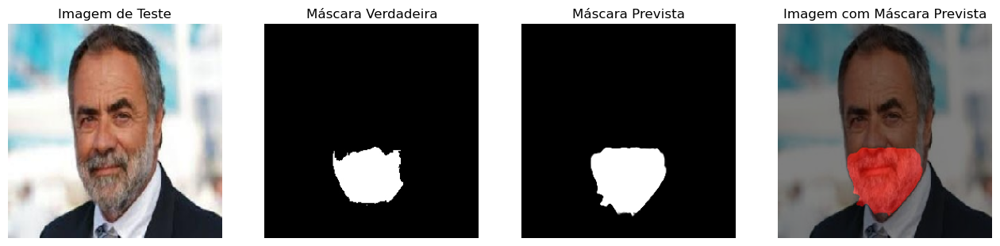

In [58]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import load_model
import random
import tensorflow.keras.backend as K

# Diretório das imagens de teste
test_image_dir = os.path.join(HOME, 'dataset_final/test/images')
label_dir = os.path.join(HOME, 'dataset_final/test/label')

# Definição do tamanho das imagens, tamanho do lote e semente aleatória
img_size = 256
batch_size = 16

# Definição do coeficiente de Dice
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

# Definição da perda de Dice
def dice_loss(y_true, y_pred):
    return 1 - dice_coeff(y_true, y_pred)

# Função para carregar e compilar o modelo
def load_trained_model(model_path='unet_model.h5'):
    model = load_model(model_path, custom_objects={'dice_loss': dice_loss, 'dice_coeff': dice_coeff})
    return model

# Carregar o modelo treinado
model = load_trained_model()

# Função para carregar e pré-processar imagens e rótulos
def load_and_preprocess_images_and_labels(image_dir, label_dir, img_size, batch_size):
    # Obter lista de caminhos dos ficheiros de imagem
    image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('webp', 'jpg', 'jpeg'))]
    # Baralhar os caminhos das imagens
    random.shuffle(image_paths)
    # Carregar e pré-processar imagens e rótulos
    images = []
    labels = []
    for img_path in image_paths[:batch_size]:
        img = load_img(img_path, target_size=(img_size, img_size))
        img_array = img_to_array(img) / 255.0  # Normalizar imagem
        images.append(img_array)
        
        # Assumindo que os rótulos têm o mesmo nome dos arquivos de imagem
        label_path = os.path.join(label_dir, os.path.basename(img_path))
        label = load_img(label_path, color_mode="grayscale", target_size=(img_size, img_size))
        label_array = img_to_array(label) / 255.0  # Normalizar rótulo
        labels.append(label_array)
    
    return np.array(images), np.array(labels)

# Carregar e pré-processar imagens de teste e rótulos
test_images, test_labels = load_and_preprocess_images_and_labels(test_image_dir, label_dir, img_size, batch_size)

# Fazer previsões nas imagens de teste
predictions = model.predict(test_images)


# Função para salvar uma imagem de teste, máscara prevista e máscara verdadeira
def save_prediction_image(test_image, test_label, prediction, filename='1.jpg'):
    
    binary_mask = (predictions > 0.5).astype('uint8')
    
    # Calculate the accuracy excluding the background
    foreground_mask = (test_labels > 0).astype('uint8')
    correct_pixels = (binary_mask[foreground_mask == 1] == test_labels[foreground_mask == 1]).astype('uint8')
    total_foreground_pixels = foreground_mask.sum()
    correct_foreground_pixel_count = correct_pixels.sum()
    accuracy = correct_foreground_pixel_count / total_foreground_pixels if total_foreground_pixels > 0 else 0
    
    # Print the accuracy
    print(f"\033[91mAccuracy: {accuracy:.4f}\033[0m")
    
    plt.figure(figsize=(16, 4))
    
    # Imagem original
    plt.subplot(1, 4, 1)
    plt.imshow(test_image)
    plt.title('Imagem de Teste')
    plt.axis('off')

    # Máscara verdadeira
    plt.subplot(1, 4, 2)
    plt.imshow(test_label.squeeze(), cmap='gray')
    plt.title('Máscara Verdadeira')
    plt.axis('off')

    # Máscara prevista (black and white)
    plt.subplot(1, 4, 3)
    plt.imshow(prediction.squeeze(), cmap='gray')
    plt.title('Máscara Prevista')
    plt.axis('off')

    # Máscara prevista sobreposta na imagem original com cor vermelha
    plt.subplot(1, 4, 4)
    red_mask = np.zeros_like(test_image)
    red_mask[..., 0] = prediction.squeeze()  # Canal vermelho
    overlay = 0.5 * test_image + 0.5 * red_mask
    plt.imshow(overlay)
    plt.title('Imagem com Máscara Prevista')
    plt.axis('off')

    plt.show()

# Salvar a primeira imagem de teste, sua máscara verdadeira e previsão
save_prediction_image(test_images[0], test_labels[0], predictions[0], filename='1.jpg')

2024-05-27 04:06:16.510072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 2s 2s/step
Accuracy: 0.6625
Accuracy: 0.7573
Accuracy: 0.7059
Accuracy: 0.7320
Accuracy: 0.6759
Accuracy: 0.7839
Accuracy: 0.7027
Accuracy: 0.8343


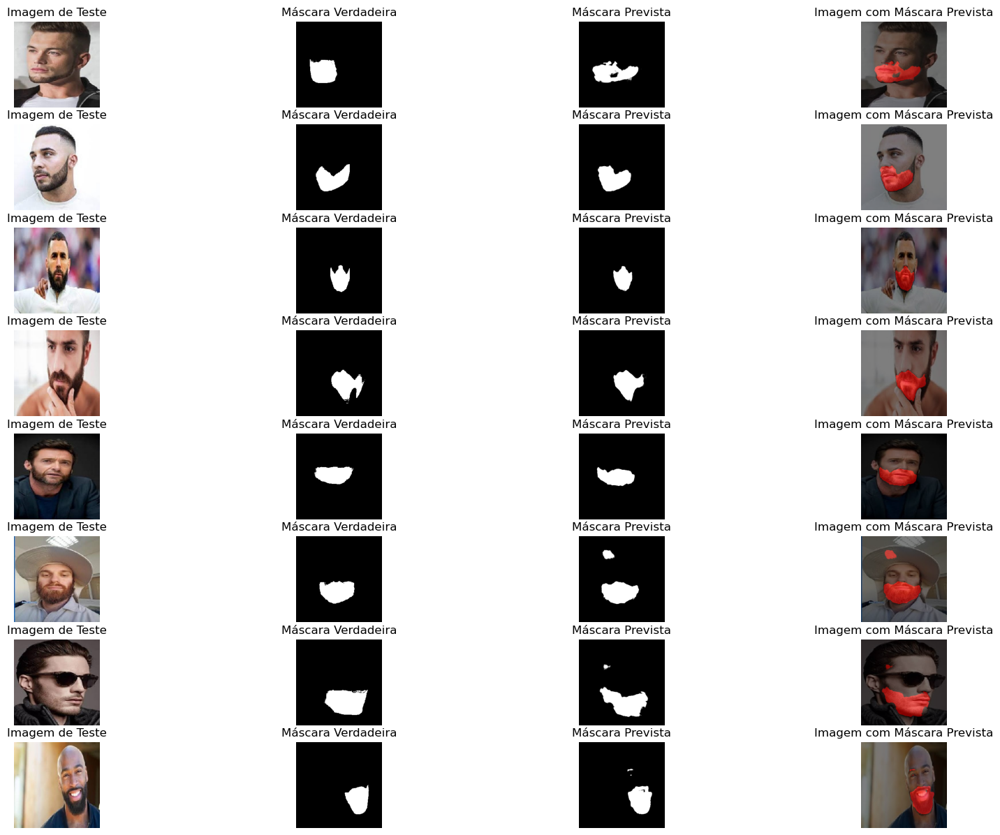

In [61]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import load_model
import random

# Diretório das imagens de teste
test_image_dir = os.path.join(HOME, 'dataset_final/test/images')
label_dir = os.path.join(HOME, 'dataset_final/test/label')

# Definição do tamanho das imagens, tamanho do lote e semente aleatória
img_size = 256
batch_size = 16

# Definição do coeficiente de Dice
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

# Definição da perda de Dice
def dice_loss(y_true, y_pred):
    return 1 - dice_coeff(y_true, y_pred)


# Função para carregar e compilar o modelo
def load_trained_model(model_path='unet_model.h5'):
    model = load_model(model_path, custom_objects={'dice_loss': dice_loss, 'dice_coeff': dice_coeff})
    return model

# Carregar o modelo treinado
model = load_trained_model()

# Função para carregar e pré-processar imagens e rótulos
def load_and_preprocess_images_and_labels(image_dir, label_dir, img_size, batch_size):
    # Obter lista de caminhos dos ficheiros de imagem
    image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.lower().endswith(('webp', 'jpg', 'jpeg'))]
    # Baralhar os caminhos das imagens
    random.shuffle(image_paths)
    # Carregar e pré-processar imagens e rótulos
    images = []
    labels = []
    for img_path in image_paths[:batch_size]:
        img = load_img(img_path, target_size=(img_size, img_size))
        img_array = img_to_array(img) / 255.0  # Normalizar imagem
        images.append(img_array)
        
        # Assumindo que os rótulos têm o mesmo nome dos arquivos de imagem
        label_path = os.path.join(label_dir, os.path.basename(img_path))
        label = load_img(label_path, color_mode="grayscale", target_size=(img_size, img_size))
        label_array = img_to_array(label) / 255.0  # Normalizar rótulo
        labels.append(label_array)
    
    return np.array(images), np.array(labels)

# Carregar e pré-processar imagens de teste e rótulos
test_images, test_labels = load_and_preprocess_images_and_labels(test_image_dir, label_dir, img_size, batch_size)

# Fazer previsões nas imagens de teste
predictions = model.predict(test_images)

# Função para exibir imagens de teste, máscaras previstas e máscaras verdadeiras com sobreposição
def display_test_predictions(test_images, test_labels, predictions, num_images=5):
    plt.figure(figsize=(20, 15))
    for i in range(num_images):
        
        binary_mask = (predictions[i] > 0.5).astype('uint8')
        
        # Calculate the accuracy excluding the background
        foreground_mask = (test_labels[i] > 0).astype('uint8')
        correct_pixels = (binary_mask[foreground_mask == 1] == test_labels[i][foreground_mask == 1]).astype('uint8')
        total_foreground_pixels = foreground_mask.sum()
        correct_foreground_pixel_count = correct_pixels.sum()
        accuracy = correct_foreground_pixel_count / total_foreground_pixels if total_foreground_pixels > 0 else 0
        
        # Print the accuracy
        print(f"\033[91mAccuracy: {accuracy:.4f}\033[0m")
        
        # Imagem original
        plt.subplot(num_images, 4, i*4 + 1)  # 4 colunas
        plt.imshow(test_images[i])
        plt.title('Imagem de Teste')
        plt.axis('off')

        # Máscara verdadeira
        plt.subplot(num_images, 4, i*4 + 2)
        plt.imshow(test_labels[i].squeeze(), cmap='gray')
        plt.title('Máscara Verdadeira')
        plt.axis('off')

        # Máscara prevista (black and white)
        plt.subplot(num_images, 4, i*4 + 3)
        plt.imshow(predictions[i].squeeze(), cmap='gray')
        plt.title('Máscara Prevista')
        plt.axis('off')

        # Máscara prevista sobreposta na imagem original com cor vermelha
        plt.subplot(num_images, 4, i*4 + 4)
        red_mask = np.zeros_like(test_images[i])
        red_mask[..., 0] = predictions[i].squeeze()  # Canal vermelho
        overlay = 0.5 * test_images[i] + 0.5 * red_mask
        plt.imshow(overlay)
        plt.title('Imagem com Máscara Prevista')
        plt.axis('off')

    plt.show()

# Exibir as primeiras 5 imagens de teste, suas máscaras verdadeiras e previsões
display_test_predictions(test_images, test_labels, predictions, num_images=8)

# O que falta

omparar vários modelos usando keras segmentation e chegar a uma conclusão em relção aos métodos utilizados. Se ainda der tempo ver a questão do inpainting mas acho que o trabalho já não precisa disso honestamente

# Conclusões Modelo

Pelos resultados do modelo que já corremos parece que o dataset foi o grande problema para a questão de segmentação. Nas imagens de teste podemos testar várias imagens desde images com outros objetos, tipos de barba diferentes etc.... Reparei que o modelo consegui prever com alguma exatidão a região da barba apesar de maior parte das vezes incluir a boca. Também reparei que se houver mais objetos na imagem como mãos ou outro tipo de objetos o modelo erradamente pode segmentar algo nessas partes mesmo que maior parte das vezes é pequeno. Penso que augmentar iamges, utilizar tamanhos de imagens maiores e usar mais imagens seria bastante util para melhorar o modelo.

# Notas

O modelo corrido ficou gravado no meu pc e ese quiserem testar eu mando-vos o ficheiro .h5 do modelo

a ideia se ainda der tempo pode ser avançar para os outros modelos e criar uma comparação entre todos ou fazer isso e também melhorar a unet que implementá-mos
